# Simulation | [44,-23] Synchrotron | FoV4

In [1]:
import joblib
import timeit

def savedata( name, obj ):
    tic=timeit.default_timer()
    with open( name,'wb' ) as Gv:
        joblib.dump( obj, Gv)
    toc=timeit.default_timer()
    print(toc - tic)
    
def loaddata( name ):
    tic=timeit.default_timer()
    with open( name,'rb' ) as Gv:
        mydata = joblib.load( Gv)
    toc=timeit.default_timer()
    print(toc - tic)
    return mydata

def load_Gfree_fitmap():
    Gfree_FoV2_fitmap = loaddata('Gfree_44_23_FoV2_fitmap.db')
    Gfree_FoV4_fitmap = loaddata('Gfree_44_23_FoV4_fitmap.db')
    return Gfree_FoV4_fitmap, Gfree_FoV2_fitmap
    
def load_Gsync_fitmap():
    Gsync_FoV2_fitmap = loaddata('Gsync_44_23_FoV2_fitmap.db')
    Gsync_FoV4_fitmap = loaddata('Gsync_44_23_FoV4_fitmap.db')
    return Gsync_FoV4_fitmap, Gsync_FoV2_fitmap

def load_Gfree_simmap():
    Fov4patch_map = loaddata('Gfree_44_23_FoV4_simmap.db')
    Fov4patch_gss = loaddata('Gfree_44_23_FoV4_simgss.db')
    Fov2patch_map = loaddata('Gfree_44_23_FoV2_simmap.db')
    Fov2patch_gss = loaddata('Gfree_44_23_FoV2_simgss.db')
    return Fov4patch_map, Fov4patch_gss, Fov2patch_map, Fov2patch_gss

def load_Gsync_simmap():
    Fov4patch_map = loaddata('Gsync_44_23_FoV4_simmap.db')
    Fov4patch_gss = loaddata('Gsync_44_23_FoV4_simgss.db')
    Fov2patch_map = loaddata('Gsync_44_23_FoV2_simmap.db')
    Fov2patch_gss = loaddata('Gsync_44_23_FoV2_simgss.db')
    return Fov4patch_map, Fov4patch_gss, Fov2patch_map, Fov2patch_gss

In [2]:
import pickle
from MCMC import MCMC
%matplotlib inline
from GalacticDev import GalacticDev

In [3]:
from GalacticCore import *
from astropy.io import fits

### Load maps

In [4]:
SF4_map, SF4_gss, SF2_map, SF2_gss = load_Gsync_simmap()

0.4448494855314493
0.5857505425810814
0.11483268067240715
0.11127829179167747


In [5]:
SF4_fitmap, SF2_fitmap = load_Gsync_fitmap()

0.02503386326134205
0.08525674045085907


#### Set-up gss-map

In [6]:
fov2grf = {}
fov2grf['fit'] = whiten(SF2_fitmap['gss'])
fov2grf['sim'] = whiten(SF2_gss)

In [7]:
fov4grf = {}
fov4grf['fit'] = whiten(SF4_fitmap['gss'])
fov4grf['sim'] = whiten(SF4_gss)

### FoV4x4

In [8]:
Sfov4 = GalacticDev( comp='Gsync', nside=32768, use_G02=True, center=( 44,-23 ), extra_large_mode=True, grfmap=fov4grf, grfpatch=True, fov = ( 4, 4 ), sim_pixel = 2, default=True )

2022-08-13 15:12:50,751 : createlog : INFO : Log Header >> Action Time : Fuction or method: level : Message
2022-08-13 15:12:50,752 : createlog : INFO : Log standard output streaming is False
2022-08-13 15:12:50,753 : createlog : INFO : GSim_Gsync_Default_True_08_13_2022_151250.log log file is created
2022-08-13 15:12:50,754 : createlog : INFO : Log is created by cxshan
2022-08-13 15:12:50,755 : createlog : INFO : Log level is debug
2022-08-13 15:12:50,756 : __init__ : INFO :  ⬇⬇⬇⬇⬇⬇⬇⬇⬇⬇⬇⬇⬇⬇⬇⬇⬇⬇⬇⬇ 
2022-08-13 15:12:50,757 : __init__ : INFO :  Galactic Gsync simulation is initializing! 
2022-08-13 15:12:50,758 : __init__ : WARNING :  sigma_tem default unit is [arcmin]! 
2022-08-13 15:12:50,759 : _set_comp : INFO : compID is galactic/synchrotron, name is Galactic synchrotron (unpolarized)
2022-08-13 15:12:50,760 : _set_default_io : INFO : Default IO is set. Output dir is /home/cxshan/data/fg21sim+/GalacticSimData/, clobber is True.
2022-08-13 15:12:50,761 : _set_default_params : INFO :  

 Please update the healpix maps when you need to. 


In [9]:
S = Sfov4

In [10]:
S.filename_pattern = '{prefix}_fov4_44-23_{frequency:06.2f}.fits'

In [11]:
S.filename_pattern

'{prefix}_fov4_44-23_{frequency:06.2f}.fits'

In [12]:
s_outhig = '/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-hig-188-196-FoV4'
s_outmid = '/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-mid-154-162-FoV4'
s_outlow = '/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-low-120-128-FoV4'

In [13]:
S.set_gamma(-2.2198359)

2022-08-13 15:12:51,586 : set_gamma : INFO :  gamma is set as -2.2198359 


In [14]:
S.set_alpha(0.03639961622243181)
S.set_beta(0.2608151388800715)

2022-08-13 15:12:51,610 : set_alpha : INFO :  alpha is set as 0.03639961622243181 
2022-08-13 15:12:51,612 : set_beta : INFO :  beta is set as 0.2608151388800715 


#### Set up frequency simulation

In [15]:
S._set_up_freq()

2022-08-13 15:14:35,500 : gen_simmap : INFO :  Finish generating the original image for simulation, using 103.86569378711283 s.
2022-08-13 15:14:35,503 : gen_simmap : INFO : Input patch flag detected. Using user input GRF patch for simulation.
2022-08-13 15:16:19,617 : gen_simmap : INFO :  Finish generating the spectral index patch image for simulation, using 103.58570091053843 s.
2022-08-13 15:16:19,620 : _set_physical_params : INFO :  Physical params are set. 


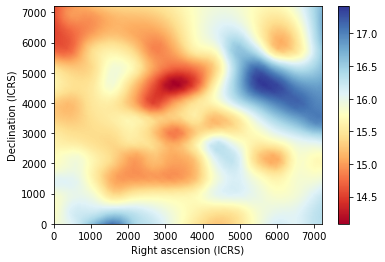

In [16]:
S.viewslice(S.patch_map)

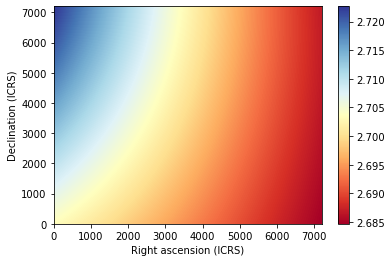

In [17]:
S.viewslice(S.patch_id)

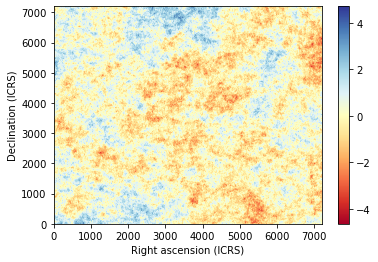

In [18]:
S.viewslice(S.patch_gss)

In [19]:
smoothed_input_map = S.smooth_sky(0.2, S.skypatch)

2022-08-13 15:16:27,717 : smooth_sky : INFO : Smoothing the <Ut.sky.SkyPatch object at 0x7ffff071f850> with a Gaussian filter ...
2022-08-13 15:19:03,801 : smooth_sky : INFO : Smoothed sky patch using Gaussian filter of sigma = 336.00 [pixel]


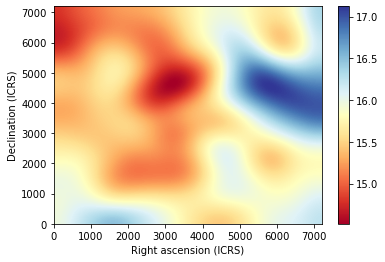

In [20]:
S.viewslice(smoothed_input_map)

In [21]:
S.skypatch.data = smoothed_input_map

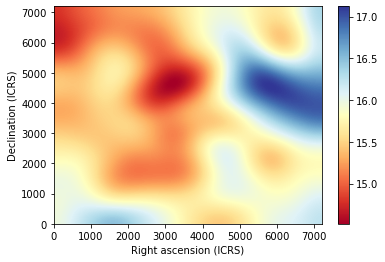

In [22]:
S.viewslice(S.skypatch.data)

### Simulate one freq

In [23]:
F158 = S.simulate_frequency(158,skytype='patch')

2022-08-13 15:19:09,195 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 158.00 [MHz] ...
2022-08-13 15:19:13,486 : add_ss : INFO : The small scale map is generated using alpha=0.03639961622243181, beta=0.2608151388800715.
2022-08-13 15:19:18,249 : simulate_frequency : INFO : Done simulate map at 158.00 [MHz].


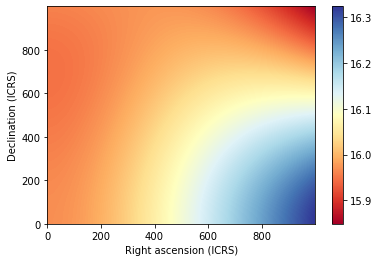

In [24]:
S.viewslice(S.skypatch.data[0:1000,0:1000])

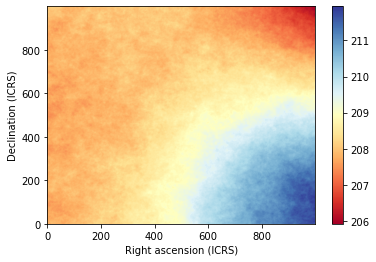

In [25]:
S.viewslice(F158.data[0:1000,0:1000])

### Simulate full freq bands

In [26]:
def do_simulation( freqlist, T, outdir ):
    T.output_dir = outdir
    for i in freqlist:
        sky = T.simulate(i, skytype='patch', smooth=False)
        print(sky)
        hdu = fits.open(sky[0])
        T.viewslice(hdu[0].data)

##### Low band

2022-08-13 15:23:44,968 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:23:44,972 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 120.00 [MHz] ...
2022-08-13 15:23:49,245 : add_ss : INFO : The small scale map is generated using alpha=0.03639961622243181, beta=0.2608151388800715.
2022-08-13 15:23:54,014 : simulate_frequency : INFO : Done simulate map at 120.00 [MHz].
2022-08-13 15:23:54,306 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-low-120-128-FoV4/gsync_fov4_44-23_120.00.fits']


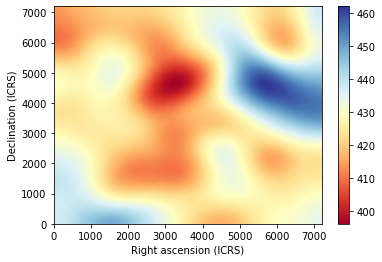

2022-08-13 15:23:56,181 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:23:56,184 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 120.16 [MHz] ...
2022-08-13 15:24:00,457 : add_ss : INFO : The small scale map is generated using alpha=0.03639961622243181, beta=0.2608151388800715.
2022-08-13 15:24:05,223 : simulate_frequency : INFO : Done simulate map at 120.16 [MHz].
2022-08-13 15:24:05,510 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-low-120-128-FoV4/gsync_fov4_44-23_120.16.fits']


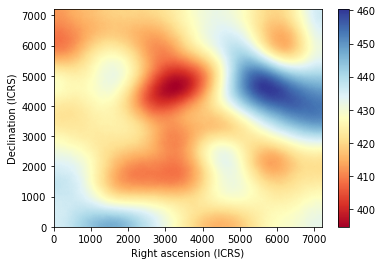

2022-08-13 15:24:07,388 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:24:07,391 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 120.32 [MHz] ...
2022-08-13 15:24:11,661 : add_ss : INFO : The small scale map is generated using alpha=0.03639961622243181, beta=0.2608151388800715.
2022-08-13 15:24:16,427 : simulate_frequency : INFO : Done simulate map at 120.32 [MHz].
2022-08-13 15:24:16,713 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-low-120-128-FoV4/gsync_fov4_44-23_120.32.fits']


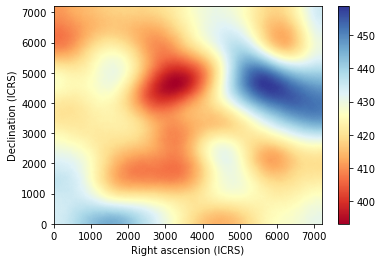

2022-08-13 15:24:18,588 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:24:18,591 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 120.48 [MHz] ...
2022-08-13 15:24:22,863 : add_ss : INFO : The small scale map is generated using alpha=0.03639961622243181, beta=0.2608151388800715.
2022-08-13 15:24:27,631 : simulate_frequency : INFO : Done simulate map at 120.48 [MHz].
2022-08-13 15:24:27,918 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-low-120-128-FoV4/gsync_fov4_44-23_120.48.fits']


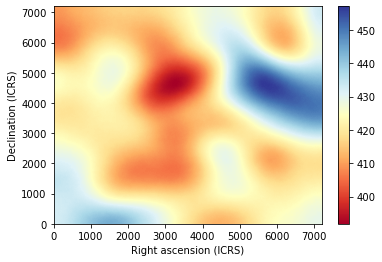

2022-08-13 15:24:29,790 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:24:29,793 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 120.64 [MHz] ...
2022-08-13 15:24:34,062 : add_ss : INFO : The small scale map is generated using alpha=0.03639961622243181, beta=0.2608151388800715.
2022-08-13 15:24:38,827 : simulate_frequency : INFO : Done simulate map at 120.64 [MHz].
2022-08-13 15:24:39,112 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-low-120-128-FoV4/gsync_fov4_44-23_120.64.fits']


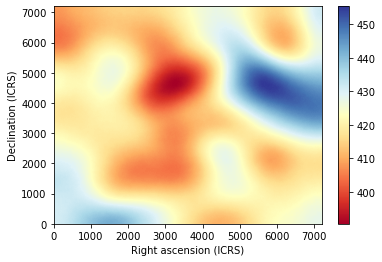

2022-08-13 15:24:40,980 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:24:40,983 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 120.80 [MHz] ...
2022-08-13 15:24:45,253 : add_ss : INFO : The small scale map is generated using alpha=0.03639961622243181, beta=0.2608151388800715.
2022-08-13 15:24:50,018 : simulate_frequency : INFO : Done simulate map at 120.80 [MHz].
2022-08-13 15:24:50,303 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-low-120-128-FoV4/gsync_fov4_44-23_120.80.fits']


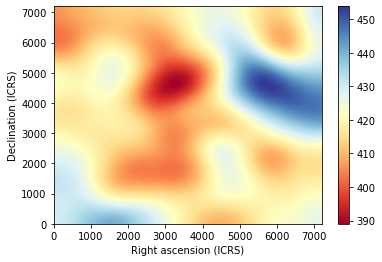

2022-08-13 15:24:52,181 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:24:52,183 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 120.96 [MHz] ...
2022-08-13 15:24:56,455 : add_ss : INFO : The small scale map is generated using alpha=0.03639961622243181, beta=0.2608151388800715.
2022-08-13 15:25:01,221 : simulate_frequency : INFO : Done simulate map at 120.96 [MHz].
2022-08-13 15:25:01,506 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-low-120-128-FoV4/gsync_fov4_44-23_120.96.fits']


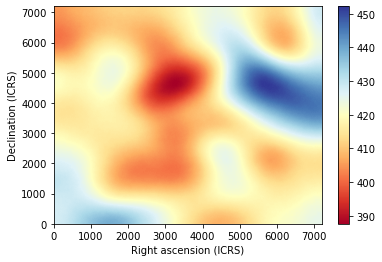

2022-08-13 15:25:03,381 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:25:03,384 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 121.12 [MHz] ...
2022-08-13 15:25:07,647 : add_ss : INFO : The small scale map is generated using alpha=0.03639961622243181, beta=0.2608151388800715.
2022-08-13 15:25:12,407 : simulate_frequency : INFO : Done simulate map at 121.12 [MHz].
2022-08-13 15:25:12,697 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-low-120-128-FoV4/gsync_fov4_44-23_121.12.fits']


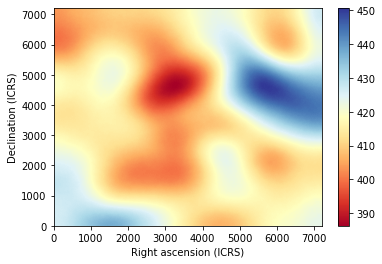

2022-08-13 15:25:14,571 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:25:14,574 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 121.28 [MHz] ...
2022-08-13 15:25:18,837 : add_ss : INFO : The small scale map is generated using alpha=0.03639961622243181, beta=0.2608151388800715.
2022-08-13 15:25:23,597 : simulate_frequency : INFO : Done simulate map at 121.28 [MHz].
2022-08-13 15:25:23,883 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-low-120-128-FoV4/gsync_fov4_44-23_121.28.fits']


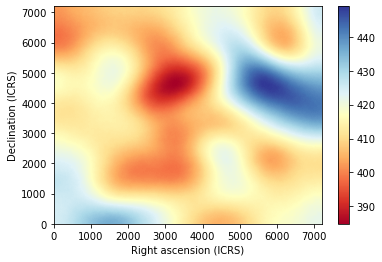

2022-08-13 15:25:25,754 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:25:25,757 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 121.44 [MHz] ...
2022-08-13 15:25:30,021 : add_ss : INFO : The small scale map is generated using alpha=0.03639961622243181, beta=0.2608151388800715.
2022-08-13 15:25:34,782 : simulate_frequency : INFO : Done simulate map at 121.44 [MHz].
2022-08-13 15:25:35,067 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-low-120-128-FoV4/gsync_fov4_44-23_121.44.fits']


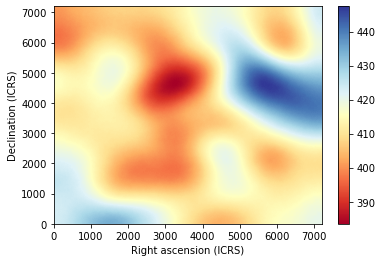

2022-08-13 15:25:36,942 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:25:36,945 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 121.60 [MHz] ...
2022-08-13 15:25:41,208 : add_ss : INFO : The small scale map is generated using alpha=0.03639961622243181, beta=0.2608151388800715.
2022-08-13 15:25:45,971 : simulate_frequency : INFO : Done simulate map at 121.60 [MHz].
2022-08-13 15:25:46,256 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-low-120-128-FoV4/gsync_fov4_44-23_121.60.fits']


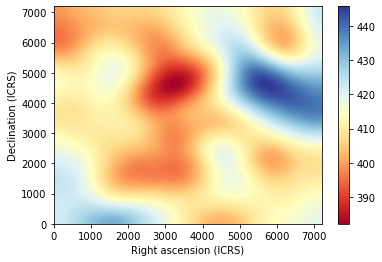

2022-08-13 15:25:48,374 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:25:48,376 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 121.76 [MHz] ...
2022-08-13 15:25:52,645 : add_ss : INFO : The small scale map is generated using alpha=0.03639961622243181, beta=0.2608151388800715.
2022-08-13 15:25:57,405 : simulate_frequency : INFO : Done simulate map at 121.76 [MHz].
2022-08-13 15:25:57,693 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-low-120-128-FoV4/gsync_fov4_44-23_121.76.fits']


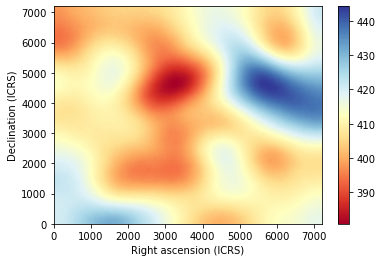

2022-08-13 15:25:59,571 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:25:59,574 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 121.92 [MHz] ...
2022-08-13 15:26:03,841 : add_ss : INFO : The small scale map is generated using alpha=0.03639961622243181, beta=0.2608151388800715.
2022-08-13 15:26:08,601 : simulate_frequency : INFO : Done simulate map at 121.92 [MHz].
2022-08-13 15:26:08,885 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-low-120-128-FoV4/gsync_fov4_44-23_121.92.fits']


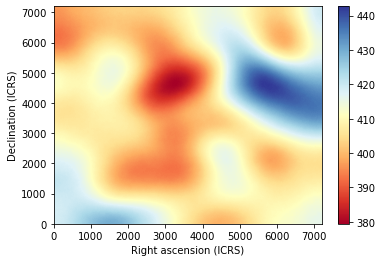

2022-08-13 15:26:10,762 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:26:10,765 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 122.08 [MHz] ...
2022-08-13 15:26:15,033 : add_ss : INFO : The small scale map is generated using alpha=0.03639961622243181, beta=0.2608151388800715.
2022-08-13 15:26:19,795 : simulate_frequency : INFO : Done simulate map at 122.08 [MHz].
2022-08-13 15:26:20,081 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-low-120-128-FoV4/gsync_fov4_44-23_122.08.fits']


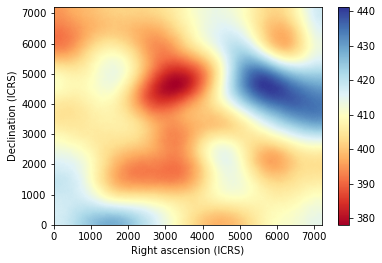

2022-08-13 15:26:21,954 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:26:21,956 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 122.24 [MHz] ...
2022-08-13 15:26:26,226 : add_ss : INFO : The small scale map is generated using alpha=0.03639961622243181, beta=0.2608151388800715.
2022-08-13 15:26:30,990 : simulate_frequency : INFO : Done simulate map at 122.24 [MHz].
2022-08-13 15:26:31,275 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-low-120-128-FoV4/gsync_fov4_44-23_122.24.fits']


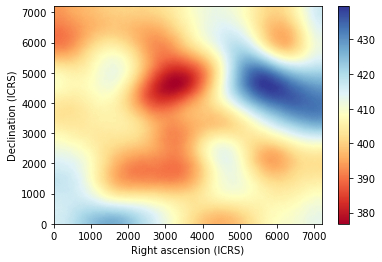

2022-08-13 15:26:33,143 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:26:33,146 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 122.40 [MHz] ...
2022-08-13 15:26:37,415 : add_ss : INFO : The small scale map is generated using alpha=0.03639961622243181, beta=0.2608151388800715.
2022-08-13 15:26:42,178 : simulate_frequency : INFO : Done simulate map at 122.40 [MHz].
2022-08-13 15:26:42,462 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-low-120-128-FoV4/gsync_fov4_44-23_122.40.fits']


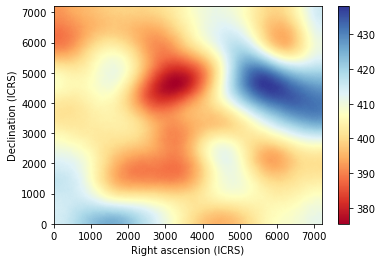

2022-08-13 15:26:44,335 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:26:44,338 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 122.56 [MHz] ...
2022-08-13 15:26:48,608 : add_ss : INFO : The small scale map is generated using alpha=0.03639961622243181, beta=0.2608151388800715.
2022-08-13 15:26:53,371 : simulate_frequency : INFO : Done simulate map at 122.56 [MHz].
2022-08-13 15:26:53,656 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-low-120-128-FoV4/gsync_fov4_44-23_122.56.fits']


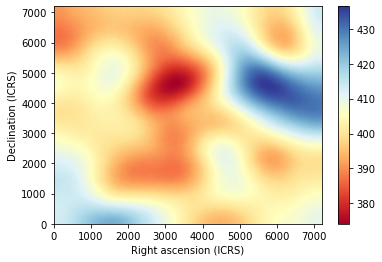

2022-08-13 15:26:55,524 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:26:55,527 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 122.72 [MHz] ...
2022-08-13 15:26:59,793 : add_ss : INFO : The small scale map is generated using alpha=0.03639961622243181, beta=0.2608151388800715.
2022-08-13 15:27:04,555 : simulate_frequency : INFO : Done simulate map at 122.72 [MHz].
2022-08-13 15:27:04,840 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-low-120-128-FoV4/gsync_fov4_44-23_122.72.fits']


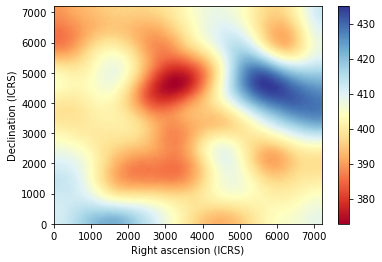

2022-08-13 15:27:06,712 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:27:06,715 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 122.88 [MHz] ...
2022-08-13 15:27:10,981 : add_ss : INFO : The small scale map is generated using alpha=0.03639961622243181, beta=0.2608151388800715.
2022-08-13 15:27:15,744 : simulate_frequency : INFO : Done simulate map at 122.88 [MHz].
2022-08-13 15:27:16,033 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-low-120-128-FoV4/gsync_fov4_44-23_122.88.fits']


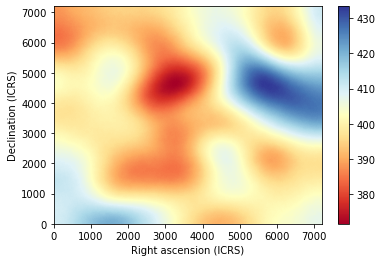

2022-08-13 15:27:17,903 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:27:17,906 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 123.04 [MHz] ...
2022-08-13 15:27:22,174 : add_ss : INFO : The small scale map is generated using alpha=0.03639961622243181, beta=0.2608151388800715.
2022-08-13 15:27:26,938 : simulate_frequency : INFO : Done simulate map at 123.04 [MHz].
2022-08-13 15:27:27,224 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-low-120-128-FoV4/gsync_fov4_44-23_123.04.fits']


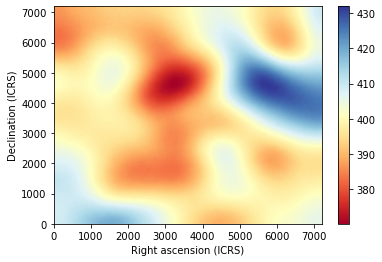

2022-08-13 15:27:29,093 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:27:29,096 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 123.20 [MHz] ...
2022-08-13 15:27:33,363 : add_ss : INFO : The small scale map is generated using alpha=0.03639961622243181, beta=0.2608151388800715.
2022-08-13 15:27:38,250 : simulate_frequency : INFO : Done simulate map at 123.20 [MHz].
2022-08-13 15:27:38,537 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-low-120-128-FoV4/gsync_fov4_44-23_123.20.fits']


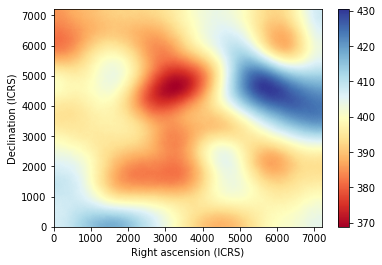

2022-08-13 15:27:40,417 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:27:40,420 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 123.36 [MHz] ...
2022-08-13 15:27:44,690 : add_ss : INFO : The small scale map is generated using alpha=0.03639961622243181, beta=0.2608151388800715.
2022-08-13 15:27:49,775 : simulate_frequency : INFO : Done simulate map at 123.36 [MHz].
2022-08-13 15:27:50,060 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-low-120-128-FoV4/gsync_fov4_44-23_123.36.fits']


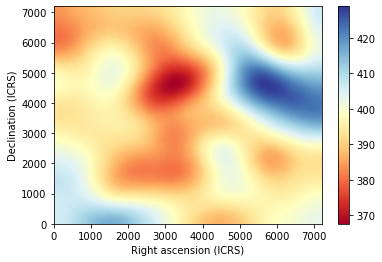

2022-08-13 15:27:52,175 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:27:52,179 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 123.52 [MHz] ...
2022-08-13 15:27:56,446 : add_ss : INFO : The small scale map is generated using alpha=0.03639961622243181, beta=0.2608151388800715.
2022-08-13 15:28:01,208 : simulate_frequency : INFO : Done simulate map at 123.52 [MHz].
2022-08-13 15:28:01,494 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-low-120-128-FoV4/gsync_fov4_44-23_123.52.fits']


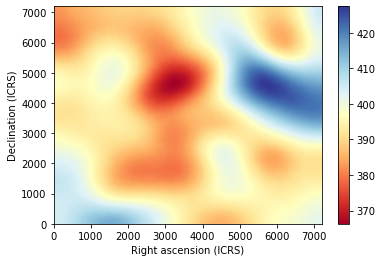

2022-08-13 15:28:03,371 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:28:03,373 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 123.68 [MHz] ...
2022-08-13 15:28:07,644 : add_ss : INFO : The small scale map is generated using alpha=0.03639961622243181, beta=0.2608151388800715.
2022-08-13 15:28:12,408 : simulate_frequency : INFO : Done simulate map at 123.68 [MHz].
2022-08-13 15:28:12,693 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-low-120-128-FoV4/gsync_fov4_44-23_123.68.fits']


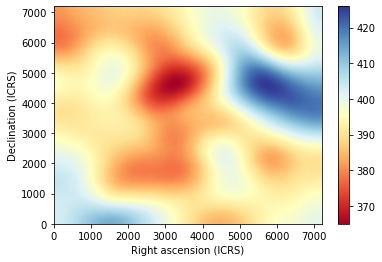

2022-08-13 15:28:14,569 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:28:14,571 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 123.84 [MHz] ...
2022-08-13 15:28:18,844 : add_ss : INFO : The small scale map is generated using alpha=0.03639961622243181, beta=0.2608151388800715.
2022-08-13 15:28:23,609 : simulate_frequency : INFO : Done simulate map at 123.84 [MHz].
2022-08-13 15:28:23,893 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-low-120-128-FoV4/gsync_fov4_44-23_123.84.fits']


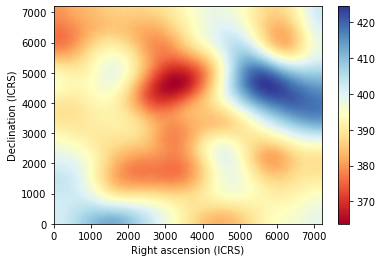

2022-08-13 15:28:25,764 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:28:25,766 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 124.00 [MHz] ...
2022-08-13 15:28:30,058 : add_ss : INFO : The small scale map is generated using alpha=0.03639961622243181, beta=0.2608151388800715.
2022-08-13 15:28:34,821 : simulate_frequency : INFO : Done simulate map at 124.00 [MHz].
2022-08-13 15:28:35,105 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-low-120-128-FoV4/gsync_fov4_44-23_124.00.fits']


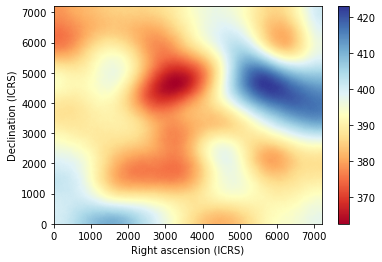

2022-08-13 15:28:36,971 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:28:36,973 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 124.16 [MHz] ...
2022-08-13 15:28:41,244 : add_ss : INFO : The small scale map is generated using alpha=0.03639961622243181, beta=0.2608151388800715.
2022-08-13 15:28:46,007 : simulate_frequency : INFO : Done simulate map at 124.16 [MHz].
2022-08-13 15:28:46,290 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-low-120-128-FoV4/gsync_fov4_44-23_124.16.fits']


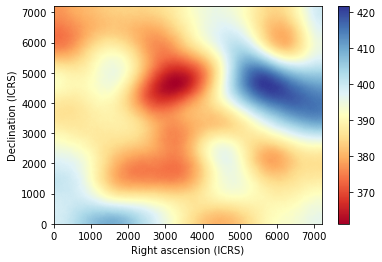

2022-08-13 15:28:48,160 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:28:48,162 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 124.32 [MHz] ...
2022-08-13 15:28:52,432 : add_ss : INFO : The small scale map is generated using alpha=0.03639961622243181, beta=0.2608151388800715.
2022-08-13 15:28:57,387 : simulate_frequency : INFO : Done simulate map at 124.32 [MHz].
2022-08-13 15:28:57,670 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-low-120-128-FoV4/gsync_fov4_44-23_124.32.fits']


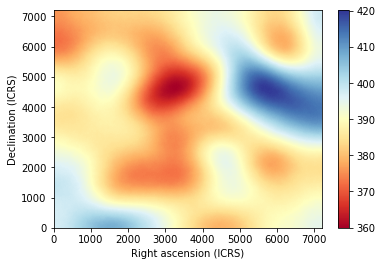

2022-08-13 15:28:59,544 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:28:59,546 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 124.48 [MHz] ...
2022-08-13 15:29:03,816 : add_ss : INFO : The small scale map is generated using alpha=0.03639961622243181, beta=0.2608151388800715.
2022-08-13 15:29:08,899 : simulate_frequency : INFO : Done simulate map at 124.48 [MHz].
2022-08-13 15:29:09,187 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-low-120-128-FoV4/gsync_fov4_44-23_124.48.fits']


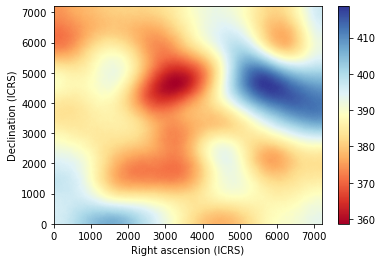

2022-08-13 15:29:11,057 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:29:11,059 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 124.64 [MHz] ...
2022-08-13 15:29:15,330 : add_ss : INFO : The small scale map is generated using alpha=0.03639961622243181, beta=0.2608151388800715.
2022-08-13 15:29:20,415 : simulate_frequency : INFO : Done simulate map at 124.64 [MHz].
2022-08-13 15:29:20,701 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-low-120-128-FoV4/gsync_fov4_44-23_124.64.fits']


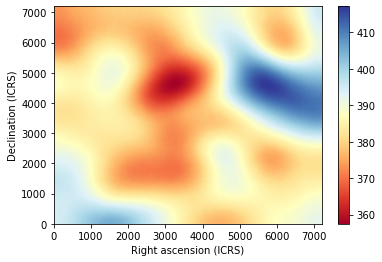

2022-08-13 15:29:22,572 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:29:22,574 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 124.80 [MHz] ...
2022-08-13 15:29:26,846 : add_ss : INFO : The small scale map is generated using alpha=0.03639961622243181, beta=0.2608151388800715.
2022-08-13 15:29:31,931 : simulate_frequency : INFO : Done simulate map at 124.80 [MHz].
2022-08-13 15:29:32,216 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-low-120-128-FoV4/gsync_fov4_44-23_124.80.fits']


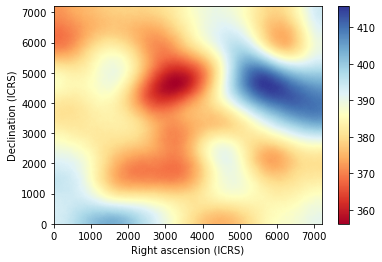

2022-08-13 15:29:34,087 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:29:34,090 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 124.96 [MHz] ...
2022-08-13 15:29:38,358 : add_ss : INFO : The small scale map is generated using alpha=0.03639961622243181, beta=0.2608151388800715.
2022-08-13 15:29:43,444 : simulate_frequency : INFO : Done simulate map at 124.96 [MHz].
2022-08-13 15:29:43,728 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-low-120-128-FoV4/gsync_fov4_44-23_124.96.fits']


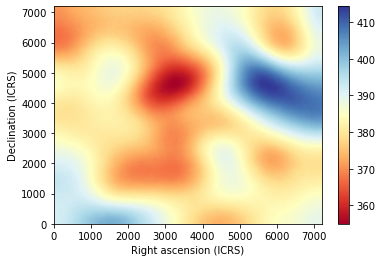

2022-08-13 15:29:45,598 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:29:45,600 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 125.12 [MHz] ...
2022-08-13 15:29:49,873 : add_ss : INFO : The small scale map is generated using alpha=0.03639961622243181, beta=0.2608151388800715.
2022-08-13 15:29:54,962 : simulate_frequency : INFO : Done simulate map at 125.12 [MHz].
2022-08-13 15:29:55,249 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-low-120-128-FoV4/gsync_fov4_44-23_125.12.fits']


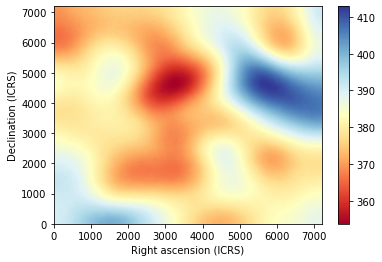

2022-08-13 15:29:57,368 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:29:57,370 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 125.28 [MHz] ...
2022-08-13 15:30:01,642 : add_ss : INFO : The small scale map is generated using alpha=0.03639961622243181, beta=0.2608151388800715.
2022-08-13 15:30:06,405 : simulate_frequency : INFO : Done simulate map at 125.28 [MHz].
2022-08-13 15:30:06,689 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-low-120-128-FoV4/gsync_fov4_44-23_125.28.fits']


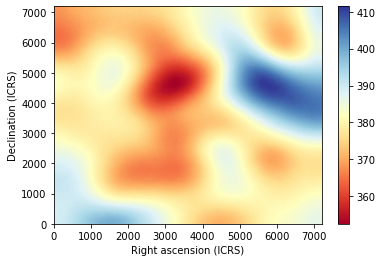

2022-08-13 15:30:08,558 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:30:08,560 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 125.44 [MHz] ...
2022-08-13 15:30:12,833 : add_ss : INFO : The small scale map is generated using alpha=0.03639961622243181, beta=0.2608151388800715.
2022-08-13 15:30:17,600 : simulate_frequency : INFO : Done simulate map at 125.44 [MHz].
2022-08-13 15:30:17,885 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-low-120-128-FoV4/gsync_fov4_44-23_125.44.fits']


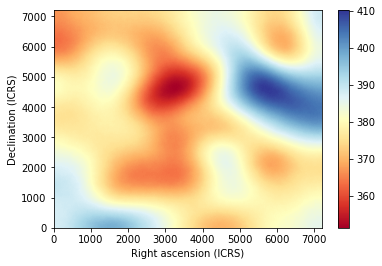

2022-08-13 15:30:19,758 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:30:19,760 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 125.60 [MHz] ...
2022-08-13 15:30:24,033 : add_ss : INFO : The small scale map is generated using alpha=0.03639961622243181, beta=0.2608151388800715.
2022-08-13 15:30:28,797 : simulate_frequency : INFO : Done simulate map at 125.60 [MHz].
2022-08-13 15:30:29,083 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-low-120-128-FoV4/gsync_fov4_44-23_125.60.fits']


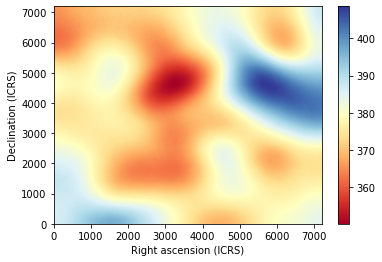

2022-08-13 15:30:30,954 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:30:30,957 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 125.76 [MHz] ...
2022-08-13 15:30:35,227 : add_ss : INFO : The small scale map is generated using alpha=0.03639961622243181, beta=0.2608151388800715.
2022-08-13 15:30:39,992 : simulate_frequency : INFO : Done simulate map at 125.76 [MHz].
2022-08-13 15:30:40,275 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-low-120-128-FoV4/gsync_fov4_44-23_125.76.fits']


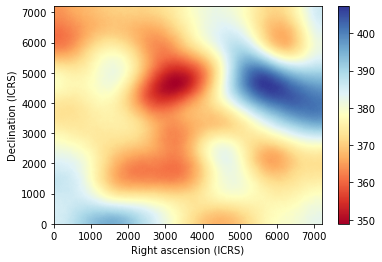

2022-08-13 15:30:42,142 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:30:42,145 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 125.92 [MHz] ...
2022-08-13 15:30:46,416 : add_ss : INFO : The small scale map is generated using alpha=0.03639961622243181, beta=0.2608151388800715.
2022-08-13 15:30:51,184 : simulate_frequency : INFO : Done simulate map at 125.92 [MHz].
2022-08-13 15:30:51,468 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-low-120-128-FoV4/gsync_fov4_44-23_125.92.fits']


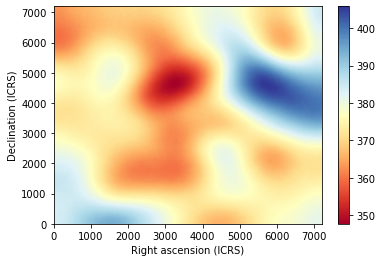

2022-08-13 15:30:53,337 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:30:53,339 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 126.08 [MHz] ...
2022-08-13 15:30:57,610 : add_ss : INFO : The small scale map is generated using alpha=0.03639961622243181, beta=0.2608151388800715.
2022-08-13 15:31:02,563 : simulate_frequency : INFO : Done simulate map at 126.08 [MHz].
2022-08-13 15:31:02,848 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-low-120-128-FoV4/gsync_fov4_44-23_126.08.fits']


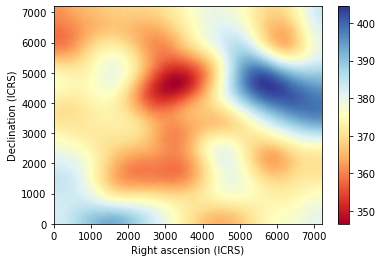

2022-08-13 15:31:04,721 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:31:04,723 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 126.24 [MHz] ...
2022-08-13 15:31:08,993 : add_ss : INFO : The small scale map is generated using alpha=0.03639961622243181, beta=0.2608151388800715.
2022-08-13 15:31:14,081 : simulate_frequency : INFO : Done simulate map at 126.24 [MHz].
2022-08-13 15:31:14,366 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-low-120-128-FoV4/gsync_fov4_44-23_126.24.fits']


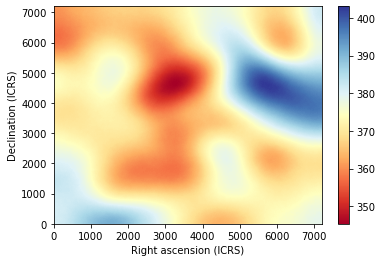

2022-08-13 15:31:16,236 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:31:16,238 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 126.40 [MHz] ...
2022-08-13 15:31:20,508 : add_ss : INFO : The small scale map is generated using alpha=0.03639961622243181, beta=0.2608151388800715.
2022-08-13 15:31:25,600 : simulate_frequency : INFO : Done simulate map at 126.40 [MHz].
2022-08-13 15:31:25,884 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-low-120-128-FoV4/gsync_fov4_44-23_126.40.fits']


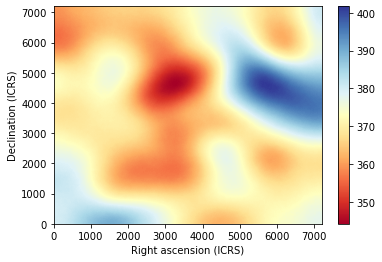

2022-08-13 15:31:27,754 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:31:27,757 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 126.56 [MHz] ...
2022-08-13 15:31:32,030 : add_ss : INFO : The small scale map is generated using alpha=0.03639961622243181, beta=0.2608151388800715.
2022-08-13 15:31:37,120 : simulate_frequency : INFO : Done simulate map at 126.56 [MHz].
2022-08-13 15:31:37,404 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-low-120-128-FoV4/gsync_fov4_44-23_126.56.fits']


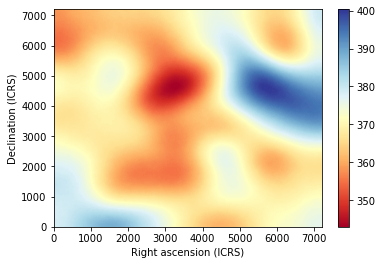

2022-08-13 15:31:39,272 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:31:39,275 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 126.72 [MHz] ...
2022-08-13 15:31:43,545 : add_ss : INFO : The small scale map is generated using alpha=0.03639961622243181, beta=0.2608151388800715.
2022-08-13 15:31:48,639 : simulate_frequency : INFO : Done simulate map at 126.72 [MHz].
2022-08-13 15:31:48,924 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-low-120-128-FoV4/gsync_fov4_44-23_126.72.fits']


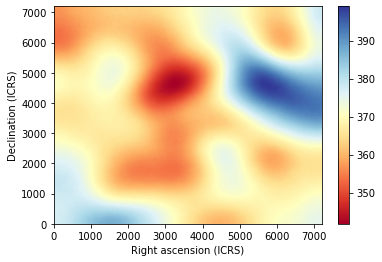

2022-08-13 15:31:50,790 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:31:50,792 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 126.88 [MHz] ...
2022-08-13 15:31:55,066 : add_ss : INFO : The small scale map is generated using alpha=0.03639961622243181, beta=0.2608151388800715.
2022-08-13 15:32:00,161 : simulate_frequency : INFO : Done simulate map at 126.88 [MHz].
2022-08-13 15:32:00,447 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-low-120-128-FoV4/gsync_fov4_44-23_126.88.fits']


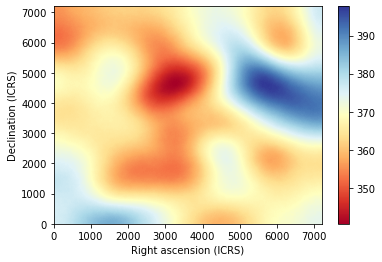

2022-08-13 15:32:02,559 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:32:02,562 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 127.04 [MHz] ...
2022-08-13 15:32:06,834 : add_ss : INFO : The small scale map is generated using alpha=0.03639961622243181, beta=0.2608151388800715.
2022-08-13 15:32:11,604 : simulate_frequency : INFO : Done simulate map at 127.04 [MHz].
2022-08-13 15:32:11,888 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-low-120-128-FoV4/gsync_fov4_44-23_127.04.fits']


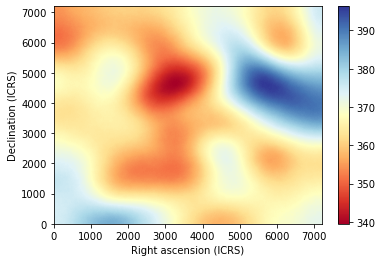

2022-08-13 15:32:13,756 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:32:13,758 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 127.20 [MHz] ...
2022-08-13 15:32:18,030 : add_ss : INFO : The small scale map is generated using alpha=0.03639961622243181, beta=0.2608151388800715.
2022-08-13 15:32:22,798 : simulate_frequency : INFO : Done simulate map at 127.20 [MHz].
2022-08-13 15:32:23,086 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-low-120-128-FoV4/gsync_fov4_44-23_127.20.fits']


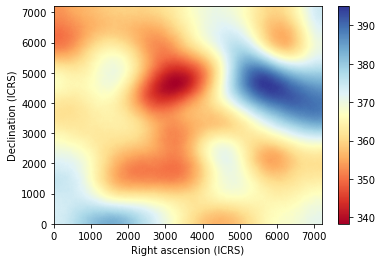

2022-08-13 15:32:24,960 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:32:24,963 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 127.36 [MHz] ...
2022-08-13 15:32:29,235 : add_ss : INFO : The small scale map is generated using alpha=0.03639961622243181, beta=0.2608151388800715.
2022-08-13 15:32:34,007 : simulate_frequency : INFO : Done simulate map at 127.36 [MHz].
2022-08-13 15:32:34,296 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-low-120-128-FoV4/gsync_fov4_44-23_127.36.fits']


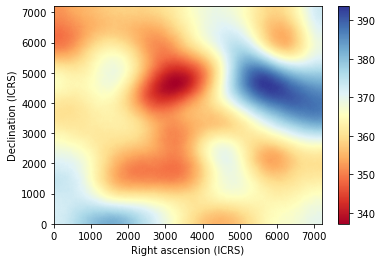

2022-08-13 15:32:36,169 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:32:36,171 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 127.52 [MHz] ...
2022-08-13 15:32:40,443 : add_ss : INFO : The small scale map is generated using alpha=0.03639961622243181, beta=0.2608151388800715.
2022-08-13 15:32:45,214 : simulate_frequency : INFO : Done simulate map at 127.52 [MHz].
2022-08-13 15:32:45,498 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-low-120-128-FoV4/gsync_fov4_44-23_127.52.fits']


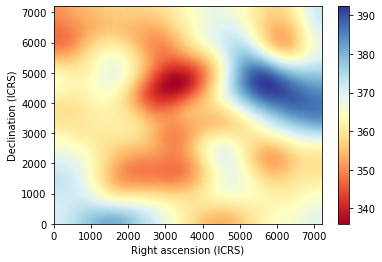

2022-08-13 15:32:47,369 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:32:47,371 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 127.68 [MHz] ...
2022-08-13 15:32:51,643 : add_ss : INFO : The small scale map is generated using alpha=0.03639961622243181, beta=0.2608151388800715.
2022-08-13 15:32:56,412 : simulate_frequency : INFO : Done simulate map at 127.68 [MHz].
2022-08-13 15:32:56,696 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-low-120-128-FoV4/gsync_fov4_44-23_127.68.fits']


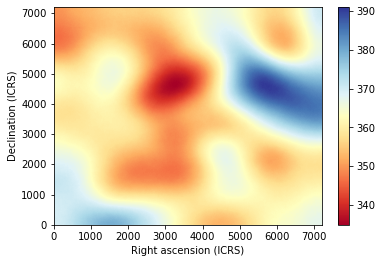

2022-08-13 15:32:58,568 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:32:58,571 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 127.84 [MHz] ...
2022-08-13 15:33:02,839 : add_ss : INFO : The small scale map is generated using alpha=0.03639961622243181, beta=0.2608151388800715.
2022-08-13 15:33:07,799 : simulate_frequency : INFO : Done simulate map at 127.84 [MHz].
2022-08-13 15:33:08,084 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-low-120-128-FoV4/gsync_fov4_44-23_127.84.fits']


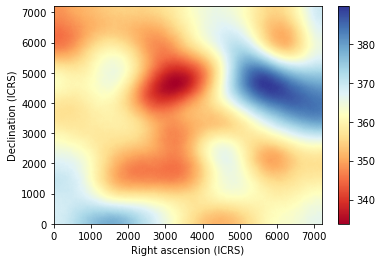

2022-08-13 15:33:09,959 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:33:09,961 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 128.00 [MHz] ...
2022-08-13 15:33:14,234 : add_ss : INFO : The small scale map is generated using alpha=0.03639961622243181, beta=0.2608151388800715.
2022-08-13 15:33:19,331 : simulate_frequency : INFO : Done simulate map at 128.00 [MHz].
2022-08-13 15:33:19,616 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-low-120-128-FoV4/gsync_fov4_44-23_128.00.fits']


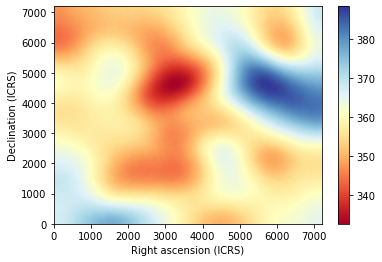

In [27]:
do_simulation(S.freqs['low']['f'], S, s_outlow)

##### Mid band

2022-08-13 15:33:21,504 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:33:21,508 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 154.00 [MHz] ...
2022-08-13 15:33:25,802 : add_ss : INFO : The small scale map is generated using alpha=0.03639961622243181, beta=0.2608151388800715.
2022-08-13 15:33:30,889 : simulate_frequency : INFO : Done simulate map at 154.00 [MHz].
2022-08-13 15:33:31,175 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-mid-154-162-FoV4/gsync_fov4_44-23_154.00.fits']


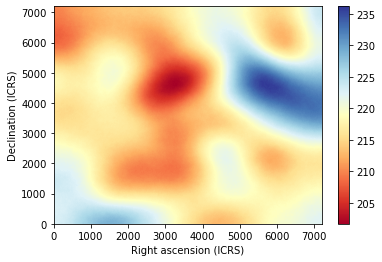

2022-08-13 15:33:33,051 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:33:33,053 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 154.16 [MHz] ...
2022-08-13 15:33:37,351 : add_ss : INFO : The small scale map is generated using alpha=0.03639961622243181, beta=0.2608151388800715.
2022-08-13 15:33:42,442 : simulate_frequency : INFO : Done simulate map at 154.16 [MHz].
2022-08-13 15:33:42,725 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-mid-154-162-FoV4/gsync_fov4_44-23_154.16.fits']


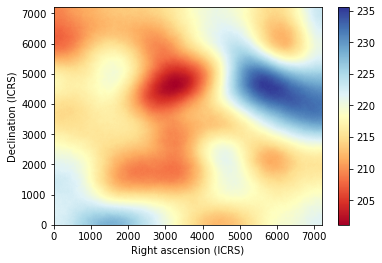

2022-08-13 15:33:44,605 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:33:44,607 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 154.32 [MHz] ...
2022-08-13 15:33:48,900 : add_ss : INFO : The small scale map is generated using alpha=0.03639961622243181, beta=0.2608151388800715.
2022-08-13 15:33:54,035 : simulate_frequency : INFO : Done simulate map at 154.32 [MHz].
2022-08-13 15:33:54,322 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-mid-154-162-FoV4/gsync_fov4_44-23_154.32.fits']


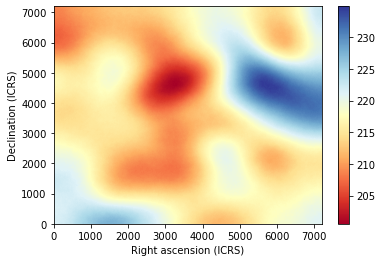

2022-08-13 15:33:56,201 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:33:56,203 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 154.48 [MHz] ...
2022-08-13 15:34:00,504 : add_ss : INFO : The small scale map is generated using alpha=0.03639961622243181, beta=0.2608151388800715.
2022-08-13 15:34:05,594 : simulate_frequency : INFO : Done simulate map at 154.48 [MHz].
2022-08-13 15:34:05,879 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-mid-154-162-FoV4/gsync_fov4_44-23_154.48.fits']


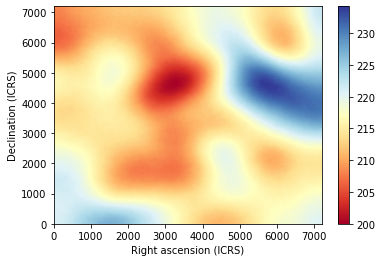

2022-08-13 15:34:08,001 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:34:08,003 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 154.64 [MHz] ...
2022-08-13 15:34:12,298 : add_ss : INFO : The small scale map is generated using alpha=0.03639961622243181, beta=0.2608151388800715.
2022-08-13 15:34:17,065 : simulate_frequency : INFO : Done simulate map at 154.64 [MHz].
2022-08-13 15:34:17,351 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-mid-154-162-FoV4/gsync_fov4_44-23_154.64.fits']


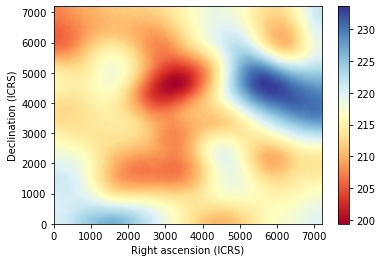

2022-08-13 15:34:19,228 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:34:19,230 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 154.80 [MHz] ...
2022-08-13 15:34:23,527 : add_ss : INFO : The small scale map is generated using alpha=0.03639961622243181, beta=0.2608151388800715.
2022-08-13 15:34:28,294 : simulate_frequency : INFO : Done simulate map at 154.80 [MHz].
2022-08-13 15:34:28,588 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-mid-154-162-FoV4/gsync_fov4_44-23_154.80.fits']


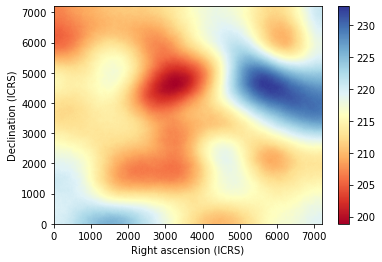

2022-08-13 15:34:30,469 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:34:30,471 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 154.96 [MHz] ...
2022-08-13 15:34:34,768 : add_ss : INFO : The small scale map is generated using alpha=0.03639961622243181, beta=0.2608151388800715.
2022-08-13 15:34:39,538 : simulate_frequency : INFO : Done simulate map at 154.96 [MHz].
2022-08-13 15:34:39,824 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-mid-154-162-FoV4/gsync_fov4_44-23_154.96.fits']


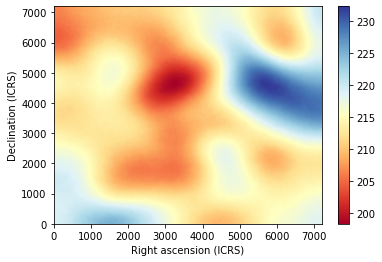

2022-08-13 15:34:41,704 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:34:41,706 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 155.12 [MHz] ...
2022-08-13 15:34:46,002 : add_ss : INFO : The small scale map is generated using alpha=0.03639961622243181, beta=0.2608151388800715.
2022-08-13 15:34:50,770 : simulate_frequency : INFO : Done simulate map at 155.12 [MHz].
2022-08-13 15:34:51,054 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-mid-154-162-FoV4/gsync_fov4_44-23_155.12.fits']


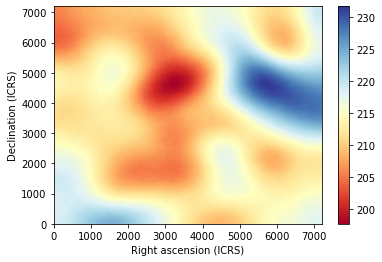

2022-08-13 15:34:52,935 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:34:52,937 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 155.28 [MHz] ...
2022-08-13 15:34:57,236 : add_ss : INFO : The small scale map is generated using alpha=0.03639961622243181, beta=0.2608151388800715.
2022-08-13 15:35:02,008 : simulate_frequency : INFO : Done simulate map at 155.28 [MHz].
2022-08-13 15:35:02,294 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-mid-154-162-FoV4/gsync_fov4_44-23_155.28.fits']


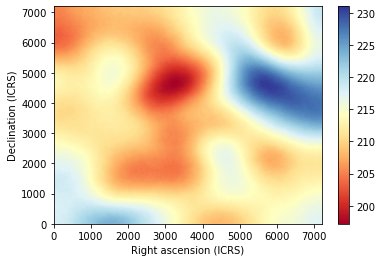

2022-08-13 15:35:04,180 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:35:04,182 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 155.44 [MHz] ...
2022-08-13 15:35:08,479 : add_ss : INFO : The small scale map is generated using alpha=0.03639961622243181, beta=0.2608151388800715.
2022-08-13 15:35:13,481 : simulate_frequency : INFO : Done simulate map at 155.44 [MHz].
2022-08-13 15:35:13,804 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-mid-154-162-FoV4/gsync_fov4_44-23_155.44.fits']


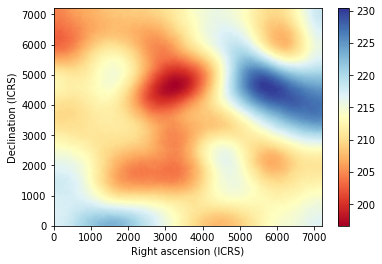

2022-08-13 15:35:15,687 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:35:15,689 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 155.60 [MHz] ...
2022-08-13 15:35:19,987 : add_ss : INFO : The small scale map is generated using alpha=0.03639961622243181, beta=0.2608151388800715.
2022-08-13 15:35:25,079 : simulate_frequency : INFO : Done simulate map at 155.60 [MHz].
2022-08-13 15:35:25,406 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-mid-154-162-FoV4/gsync_fov4_44-23_155.60.fits']


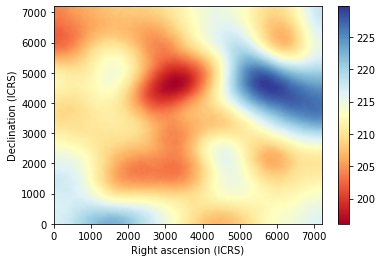

2022-08-13 15:35:27,283 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:35:27,285 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 155.76 [MHz] ...
2022-08-13 15:35:31,580 : add_ss : INFO : The small scale map is generated using alpha=0.03639961622243181, beta=0.2608151388800715.
2022-08-13 15:35:36,671 : simulate_frequency : INFO : Done simulate map at 155.76 [MHz].
2022-08-13 15:35:36,972 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-mid-154-162-FoV4/gsync_fov4_44-23_155.76.fits']


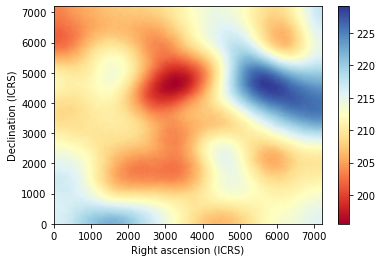

2022-08-13 15:35:38,845 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:35:38,847 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 155.92 [MHz] ...
2022-08-13 15:35:43,143 : add_ss : INFO : The small scale map is generated using alpha=0.03639961622243181, beta=0.2608151388800715.
2022-08-13 15:35:48,230 : simulate_frequency : INFO : Done simulate map at 155.92 [MHz].
2022-08-13 15:35:48,516 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-mid-154-162-FoV4/gsync_fov4_44-23_155.92.fits']


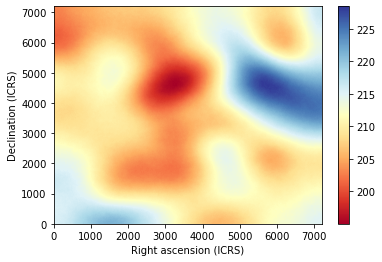

2022-08-13 15:35:50,397 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:35:50,399 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 156.08 [MHz] ...
2022-08-13 15:35:54,695 : add_ss : INFO : The small scale map is generated using alpha=0.03639961622243181, beta=0.2608151388800715.
2022-08-13 15:35:59,785 : simulate_frequency : INFO : Done simulate map at 156.08 [MHz].
2022-08-13 15:36:00,069 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-mid-154-162-FoV4/gsync_fov4_44-23_156.08.fits']


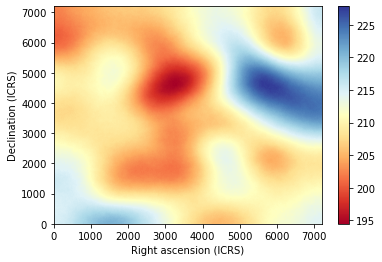

2022-08-13 15:36:01,950 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:36:01,952 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 156.24 [MHz] ...
2022-08-13 15:36:06,252 : add_ss : INFO : The small scale map is generated using alpha=0.03639961622243181, beta=0.2608151388800715.
2022-08-13 15:36:11,342 : simulate_frequency : INFO : Done simulate map at 156.24 [MHz].
2022-08-13 15:36:11,628 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-mid-154-162-FoV4/gsync_fov4_44-23_156.24.fits']


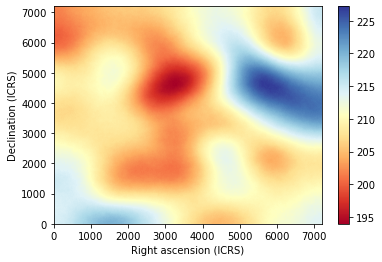

2022-08-13 15:36:13,755 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:36:13,757 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 156.40 [MHz] ...
2022-08-13 15:36:18,056 : add_ss : INFO : The small scale map is generated using alpha=0.03639961622243181, beta=0.2608151388800715.
2022-08-13 15:36:22,823 : simulate_frequency : INFO : Done simulate map at 156.40 [MHz].
2022-08-13 15:36:23,129 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-mid-154-162-FoV4/gsync_fov4_44-23_156.40.fits']


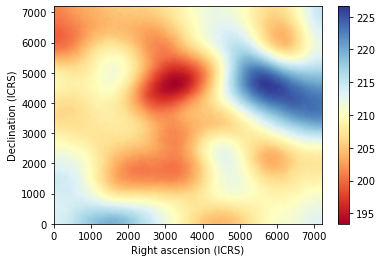

2022-08-13 15:36:25,006 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:36:25,008 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 156.56 [MHz] ...
2022-08-13 15:36:29,305 : add_ss : INFO : The small scale map is generated using alpha=0.03639961622243181, beta=0.2608151388800715.
2022-08-13 15:36:34,069 : simulate_frequency : INFO : Done simulate map at 156.56 [MHz].
2022-08-13 15:36:34,353 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-mid-154-162-FoV4/gsync_fov4_44-23_156.56.fits']


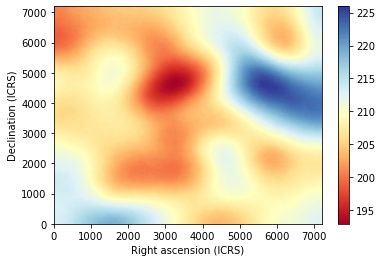

2022-08-13 15:36:36,236 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:36:36,238 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 156.72 [MHz] ...
2022-08-13 15:36:40,536 : add_ss : INFO : The small scale map is generated using alpha=0.03639961622243181, beta=0.2608151388800715.
2022-08-13 15:36:45,346 : simulate_frequency : INFO : Done simulate map at 156.72 [MHz].
2022-08-13 15:36:45,640 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-mid-154-162-FoV4/gsync_fov4_44-23_156.72.fits']


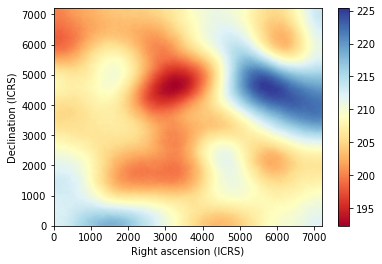

2022-08-13 15:36:47,527 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:36:47,529 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 156.88 [MHz] ...
2022-08-13 15:36:51,823 : add_ss : INFO : The small scale map is generated using alpha=0.03639961622243181, beta=0.2608151388800715.
2022-08-13 15:36:56,589 : simulate_frequency : INFO : Done simulate map at 156.88 [MHz].
2022-08-13 15:36:56,873 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-mid-154-162-FoV4/gsync_fov4_44-23_156.88.fits']


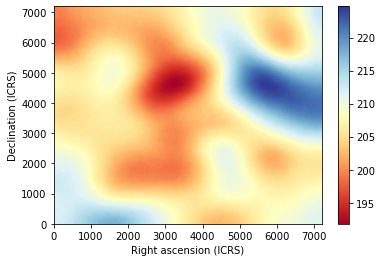

2022-08-13 15:36:58,747 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:36:58,749 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 157.04 [MHz] ...
2022-08-13 15:37:03,047 : add_ss : INFO : The small scale map is generated using alpha=0.03639961622243181, beta=0.2608151388800715.
2022-08-13 15:37:07,810 : simulate_frequency : INFO : Done simulate map at 157.04 [MHz].
2022-08-13 15:37:08,096 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-mid-154-162-FoV4/gsync_fov4_44-23_157.04.fits']


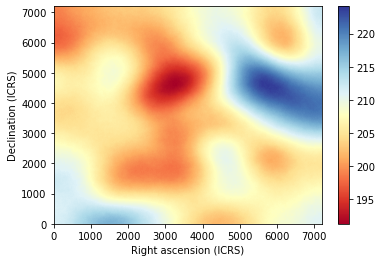

2022-08-13 15:37:09,973 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:37:09,976 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 157.20 [MHz] ...
2022-08-13 15:37:14,272 : add_ss : INFO : The small scale map is generated using alpha=0.03639961622243181, beta=0.2608151388800715.
2022-08-13 15:37:19,324 : simulate_frequency : INFO : Done simulate map at 157.20 [MHz].
2022-08-13 15:37:19,639 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-mid-154-162-FoV4/gsync_fov4_44-23_157.20.fits']


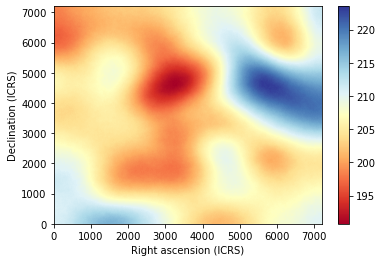

2022-08-13 15:37:21,522 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:37:21,525 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 157.36 [MHz] ...
2022-08-13 15:37:25,928 : add_ss : INFO : The small scale map is generated using alpha=0.03639961622243181, beta=0.2608151388800715.
2022-08-13 15:37:31,601 : simulate_frequency : INFO : Done simulate map at 157.36 [MHz].
2022-08-13 15:37:32,028 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-mid-154-162-FoV4/gsync_fov4_44-23_157.36.fits']


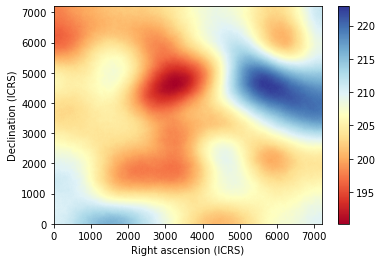

2022-08-13 15:37:33,917 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:37:33,919 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 157.52 [MHz] ...
2022-08-13 15:37:38,835 : add_ss : INFO : The small scale map is generated using alpha=0.03639961622243181, beta=0.2608151388800715.
2022-08-13 15:37:45,080 : simulate_frequency : INFO : Done simulate map at 157.52 [MHz].
2022-08-13 15:37:45,509 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-mid-154-162-FoV4/gsync_fov4_44-23_157.52.fits']


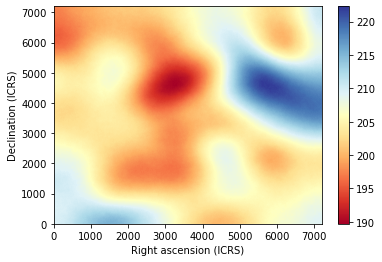

2022-08-13 15:37:47,401 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:37:47,403 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 157.68 [MHz] ...
2022-08-13 15:37:52,943 : add_ss : INFO : The small scale map is generated using alpha=0.03639961622243181, beta=0.2608151388800715.
2022-08-13 15:38:00,144 : simulate_frequency : INFO : Done simulate map at 157.68 [MHz].
2022-08-13 15:38:00,678 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-mid-154-162-FoV4/gsync_fov4_44-23_157.68.fits']


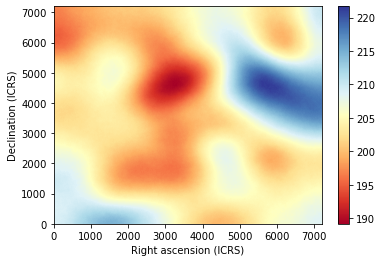

2022-08-13 15:38:05,501 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:38:05,503 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 157.84 [MHz] ...
2022-08-13 15:38:11,820 : add_ss : INFO : The small scale map is generated using alpha=0.03639961622243181, beta=0.2608151388800715.
2022-08-13 15:38:19,395 : simulate_frequency : INFO : Done simulate map at 157.84 [MHz].
2022-08-13 15:38:20,397 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-mid-154-162-FoV4/gsync_fov4_44-23_157.84.fits']


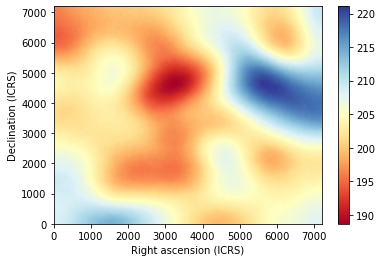

2022-08-13 15:38:26,372 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:38:26,375 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 158.00 [MHz] ...
2022-08-13 15:38:32,689 : add_ss : INFO : The small scale map is generated using alpha=0.03639961622243181, beta=0.2608151388800715.
2022-08-13 15:38:40,199 : simulate_frequency : INFO : Done simulate map at 158.00 [MHz].
2022-08-13 15:38:41,241 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-mid-154-162-FoV4/gsync_fov4_44-23_158.00.fits']


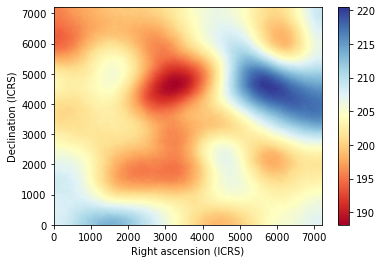

2022-08-13 15:38:43,488 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:38:43,490 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 158.16 [MHz] ...
2022-08-13 15:38:47,784 : add_ss : INFO : The small scale map is generated using alpha=0.03639961622243181, beta=0.2608151388800715.
2022-08-13 15:38:52,543 : simulate_frequency : INFO : Done simulate map at 158.16 [MHz].
2022-08-13 15:38:52,827 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-mid-154-162-FoV4/gsync_fov4_44-23_158.16.fits']


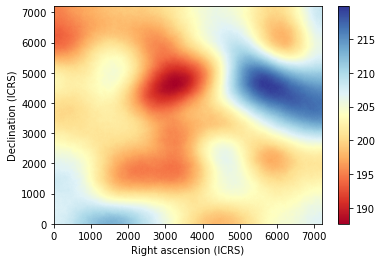

2022-08-13 15:38:54,701 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:38:54,704 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 158.32 [MHz] ...
2022-08-13 15:38:58,998 : add_ss : INFO : The small scale map is generated using alpha=0.03639961622243181, beta=0.2608151388800715.
2022-08-13 15:39:04,181 : simulate_frequency : INFO : Done simulate map at 158.32 [MHz].
2022-08-13 15:39:04,538 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-mid-154-162-FoV4/gsync_fov4_44-23_158.32.fits']


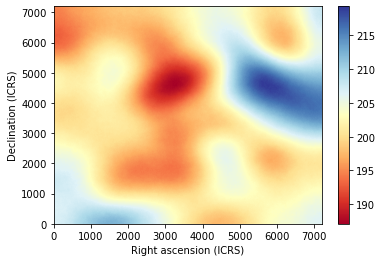

2022-08-13 15:39:06,420 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:39:06,423 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 158.48 [MHz] ...
2022-08-13 15:39:10,978 : add_ss : INFO : The small scale map is generated using alpha=0.03639961622243181, beta=0.2608151388800715.
2022-08-13 15:39:16,686 : simulate_frequency : INFO : Done simulate map at 158.48 [MHz].
2022-08-13 15:39:17,111 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-mid-154-162-FoV4/gsync_fov4_44-23_158.48.fits']


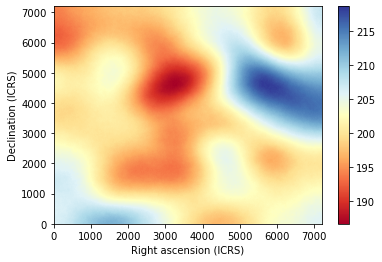

2022-08-13 15:39:18,996 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:39:18,998 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 158.64 [MHz] ...
2022-08-13 15:39:24,049 : add_ss : INFO : The small scale map is generated using alpha=0.03639961622243181, beta=0.2608151388800715.
2022-08-13 15:39:30,425 : simulate_frequency : INFO : Done simulate map at 158.64 [MHz].
2022-08-13 15:39:30,872 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-mid-154-162-FoV4/gsync_fov4_44-23_158.64.fits']


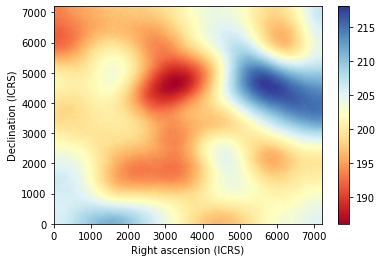

2022-08-13 15:39:33,066 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:39:33,068 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 158.80 [MHz] ...
2022-08-13 15:39:38,919 : add_ss : INFO : The small scale map is generated using alpha=0.03639961622243181, beta=0.2608151388800715.
2022-08-13 15:39:46,104 : simulate_frequency : INFO : Done simulate map at 158.80 [MHz].
2022-08-13 15:39:46,764 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-mid-154-162-FoV4/gsync_fov4_44-23_158.80.fits']


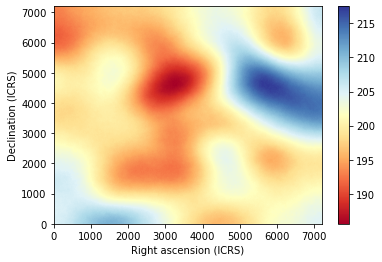

2022-08-13 15:39:51,752 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:39:51,754 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 158.96 [MHz] ...
2022-08-13 15:39:58,064 : add_ss : INFO : The small scale map is generated using alpha=0.03639961622243181, beta=0.2608151388800715.
2022-08-13 15:40:05,534 : simulate_frequency : INFO : Done simulate map at 158.96 [MHz].
2022-08-13 15:40:06,535 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-mid-154-162-FoV4/gsync_fov4_44-23_158.96.fits']


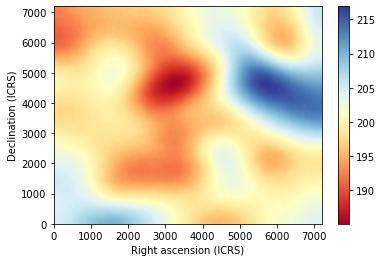

2022-08-13 15:40:12,502 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:40:12,505 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 159.12 [MHz] ...
2022-08-13 15:40:18,821 : add_ss : INFO : The small scale map is generated using alpha=0.03639961622243181, beta=0.2608151388800715.
2022-08-13 15:40:26,332 : simulate_frequency : INFO : Done simulate map at 159.12 [MHz].
2022-08-13 15:40:27,334 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-mid-154-162-FoV4/gsync_fov4_44-23_159.12.fits']


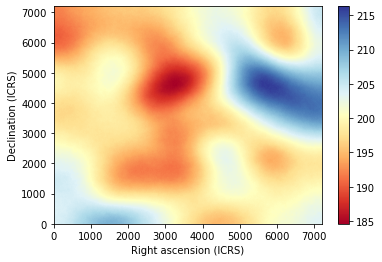

2022-08-13 15:40:33,307 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:40:33,309 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 159.28 [MHz] ...
2022-08-13 15:40:39,628 : add_ss : INFO : The small scale map is generated using alpha=0.03639961622243181, beta=0.2608151388800715.
2022-08-13 15:40:47,195 : simulate_frequency : INFO : Done simulate map at 159.28 [MHz].
2022-08-13 15:40:48,195 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-mid-154-162-FoV4/gsync_fov4_44-23_159.28.fits']


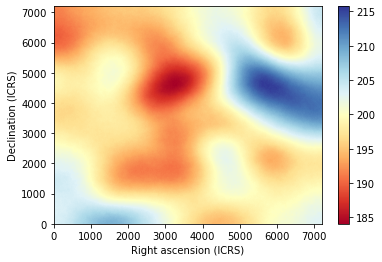

2022-08-13 15:40:54,177 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:40:54,180 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 159.44 [MHz] ...
2022-08-13 15:41:00,502 : add_ss : INFO : The small scale map is generated using alpha=0.03639961622243181, beta=0.2608151388800715.
2022-08-13 15:41:07,975 : simulate_frequency : INFO : Done simulate map at 159.44 [MHz].
2022-08-13 15:41:08,974 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-mid-154-162-FoV4/gsync_fov4_44-23_159.44.fits']


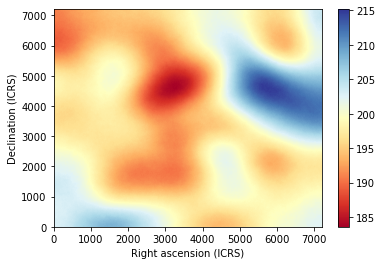

2022-08-13 15:41:14,954 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:41:14,956 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 159.60 [MHz] ...
2022-08-13 15:41:21,284 : add_ss : INFO : The small scale map is generated using alpha=0.03639961622243181, beta=0.2608151388800715.
2022-08-13 15:41:28,818 : simulate_frequency : INFO : Done simulate map at 159.60 [MHz].
2022-08-13 15:41:29,821 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-mid-154-162-FoV4/gsync_fov4_44-23_159.60.fits']


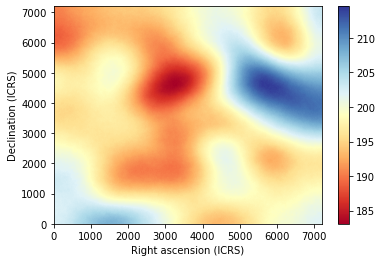

2022-08-13 15:41:35,787 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:41:35,790 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 159.76 [MHz] ...
2022-08-13 15:41:42,118 : add_ss : INFO : The small scale map is generated using alpha=0.03639961622243181, beta=0.2608151388800715.
2022-08-13 15:41:49,580 : simulate_frequency : INFO : Done simulate map at 159.76 [MHz].
2022-08-13 15:41:50,587 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-mid-154-162-FoV4/gsync_fov4_44-23_159.76.fits']


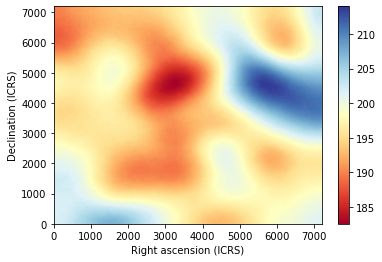

2022-08-13 15:41:52,861 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:41:52,863 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 159.92 [MHz] ...
2022-08-13 15:41:57,431 : add_ss : INFO : The small scale map is generated using alpha=0.03639961622243181, beta=0.2608151388800715.
2022-08-13 15:42:03,136 : simulate_frequency : INFO : Done simulate map at 159.92 [MHz].
2022-08-13 15:42:03,562 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-mid-154-162-FoV4/gsync_fov4_44-23_159.92.fits']


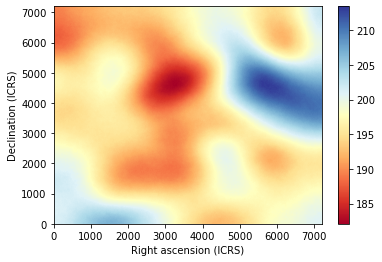

2022-08-13 15:42:05,453 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:42:05,455 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 160.08 [MHz] ...
2022-08-13 15:42:10,521 : add_ss : INFO : The small scale map is generated using alpha=0.03639961622243181, beta=0.2608151388800715.
2022-08-13 15:42:16,937 : simulate_frequency : INFO : Done simulate map at 160.08 [MHz].
2022-08-13 15:42:17,371 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-mid-154-162-FoV4/gsync_fov4_44-23_160.08.fits']


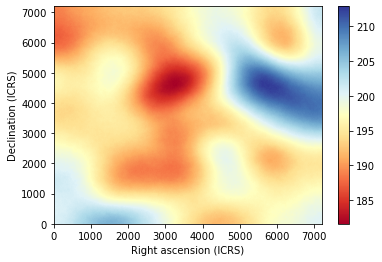

2022-08-13 15:42:19,719 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:42:19,721 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 160.24 [MHz] ...
2022-08-13 15:42:25,603 : add_ss : INFO : The small scale map is generated using alpha=0.03639961622243181, beta=0.2608151388800715.
2022-08-13 15:42:32,816 : simulate_frequency : INFO : Done simulate map at 160.24 [MHz].
2022-08-13 15:42:33,498 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-mid-154-162-FoV4/gsync_fov4_44-23_160.24.fits']


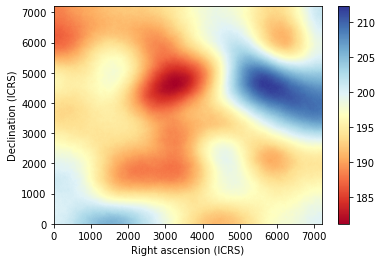

2022-08-13 15:42:38,554 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:42:38,556 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 160.40 [MHz] ...
2022-08-13 15:42:44,875 : add_ss : INFO : The small scale map is generated using alpha=0.03639961622243181, beta=0.2608151388800715.
2022-08-13 15:42:52,321 : simulate_frequency : INFO : Done simulate map at 160.40 [MHz].
2022-08-13 15:42:53,322 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-mid-154-162-FoV4/gsync_fov4_44-23_160.40.fits']


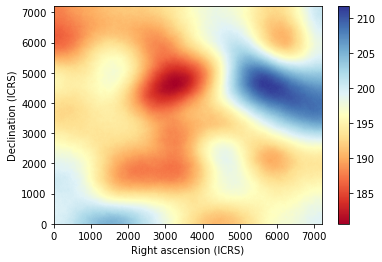

2022-08-13 15:42:59,297 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:42:59,299 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 160.56 [MHz] ...
2022-08-13 15:43:05,622 : add_ss : INFO : The small scale map is generated using alpha=0.03639961622243181, beta=0.2608151388800715.
2022-08-13 15:43:13,076 : simulate_frequency : INFO : Done simulate map at 160.56 [MHz].
2022-08-13 15:43:14,077 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-mid-154-162-FoV4/gsync_fov4_44-23_160.56.fits']


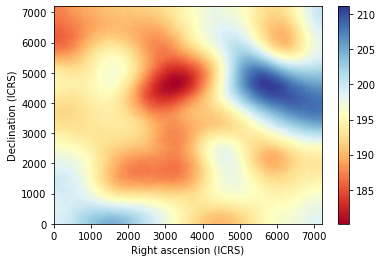

2022-08-13 15:43:20,083 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:43:20,086 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 160.72 [MHz] ...
2022-08-13 15:43:26,414 : add_ss : INFO : The small scale map is generated using alpha=0.03639961622243181, beta=0.2608151388800715.
2022-08-13 15:43:33,869 : simulate_frequency : INFO : Done simulate map at 160.72 [MHz].
2022-08-13 15:43:34,874 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-mid-154-162-FoV4/gsync_fov4_44-23_160.72.fits']


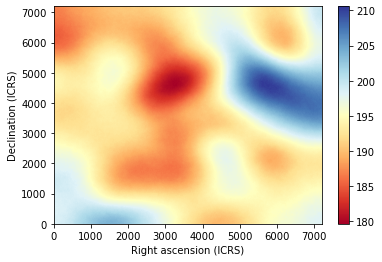

2022-08-13 15:43:40,857 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:43:40,859 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 160.88 [MHz] ...
2022-08-13 15:43:47,181 : add_ss : INFO : The small scale map is generated using alpha=0.03639961622243181, beta=0.2608151388800715.
2022-08-13 15:43:54,634 : simulate_frequency : INFO : Done simulate map at 160.88 [MHz].
2022-08-13 15:43:55,640 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-mid-154-162-FoV4/gsync_fov4_44-23_160.88.fits']


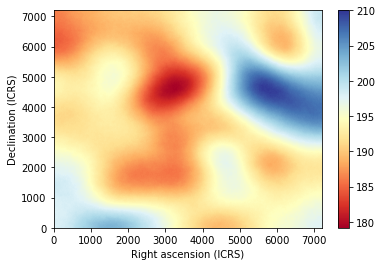

2022-08-13 15:44:01,606 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:44:01,609 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 161.04 [MHz] ...
2022-08-13 15:44:07,930 : add_ss : INFO : The small scale map is generated using alpha=0.03639961622243181, beta=0.2608151388800715.
2022-08-13 15:44:15,394 : simulate_frequency : INFO : Done simulate map at 161.04 [MHz].
2022-08-13 15:44:16,399 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-mid-154-162-FoV4/gsync_fov4_44-23_161.04.fits']


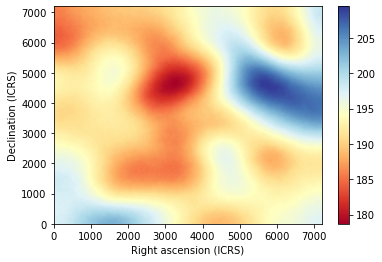

2022-08-13 15:44:22,368 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:44:22,370 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 161.20 [MHz] ...
2022-08-13 15:44:28,701 : add_ss : INFO : The small scale map is generated using alpha=0.03639961622243181, beta=0.2608151388800715.
2022-08-13 15:44:36,161 : simulate_frequency : INFO : Done simulate map at 161.20 [MHz].
2022-08-13 15:44:37,167 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-mid-154-162-FoV4/gsync_fov4_44-23_161.20.fits']


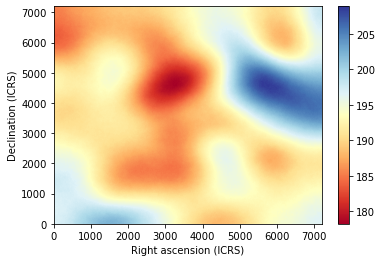

2022-08-13 15:44:43,150 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:44:43,152 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 161.36 [MHz] ...
2022-08-13 15:44:49,482 : add_ss : INFO : The small scale map is generated using alpha=0.03639961622243181, beta=0.2608151388800715.
2022-08-13 15:44:56,940 : simulate_frequency : INFO : Done simulate map at 161.36 [MHz].
2022-08-13 15:44:57,947 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-mid-154-162-FoV4/gsync_fov4_44-23_161.36.fits']


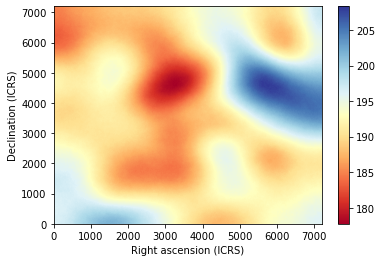

2022-08-13 15:45:03,914 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:45:03,917 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 161.52 [MHz] ...
2022-08-13 15:45:10,240 : add_ss : INFO : The small scale map is generated using alpha=0.03639961622243181, beta=0.2608151388800715.
2022-08-13 15:45:17,852 : simulate_frequency : INFO : Done simulate map at 161.52 [MHz].
2022-08-13 15:45:18,858 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-mid-154-162-FoV4/gsync_fov4_44-23_161.52.fits']


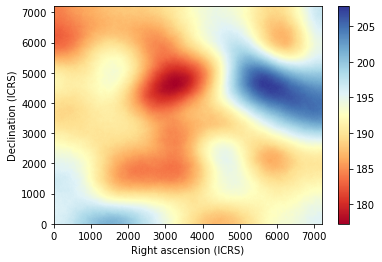

2022-08-13 15:45:21,156 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:45:21,158 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 161.68 [MHz] ...
2022-08-13 15:45:26,229 : add_ss : INFO : The small scale map is generated using alpha=0.03639961622243181, beta=0.2608151388800715.
2022-08-13 15:45:32,656 : simulate_frequency : INFO : Done simulate map at 161.68 [MHz].
2022-08-13 15:45:33,088 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-mid-154-162-FoV4/gsync_fov4_44-23_161.68.fits']


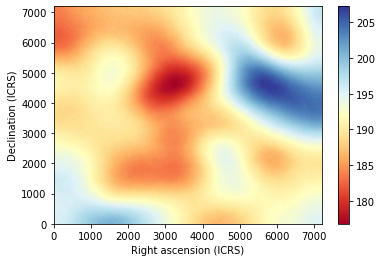

2022-08-13 15:45:35,514 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:45:35,516 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 161.84 [MHz] ...
2022-08-13 15:45:41,417 : add_ss : INFO : The small scale map is generated using alpha=0.03639961622243181, beta=0.2608151388800715.
2022-08-13 15:45:48,634 : simulate_frequency : INFO : Done simulate map at 161.84 [MHz].
2022-08-13 15:45:49,326 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-mid-154-162-FoV4/gsync_fov4_44-23_161.84.fits']


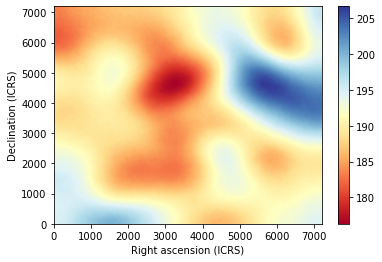

2022-08-13 15:45:54,405 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:45:54,407 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 162.00 [MHz] ...
2022-08-13 15:46:00,729 : add_ss : INFO : The small scale map is generated using alpha=0.03639961622243181, beta=0.2608151388800715.
2022-08-13 15:46:08,186 : simulate_frequency : INFO : Done simulate map at 162.00 [MHz].
2022-08-13 15:46:09,188 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-mid-154-162-FoV4/gsync_fov4_44-23_162.00.fits']


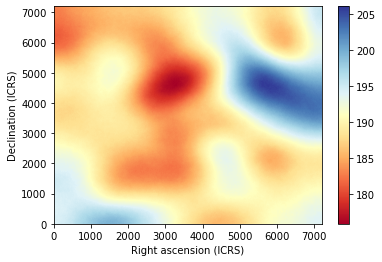

In [28]:
do_simulation(S.freqs['mid']['f'], S, s_outmid)

##### hig band

2022-08-13 15:46:15,200 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:46:15,203 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 188.00 [MHz] ...
2022-08-13 15:46:21,529 : add_ss : INFO : The small scale map is generated using alpha=0.03639961622243181, beta=0.2608151388800715.
2022-08-13 15:46:28,983 : simulate_frequency : INFO : Done simulate map at 188.00 [MHz].
2022-08-13 15:46:29,990 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-hig-188-196-FoV4/gsync_fov4_44-23_188.00.fits']


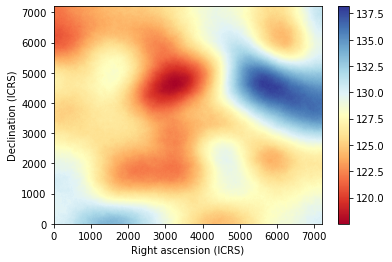

2022-08-13 15:46:35,963 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:46:35,966 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 188.16 [MHz] ...
2022-08-13 15:46:42,288 : add_ss : INFO : The small scale map is generated using alpha=0.03639961622243181, beta=0.2608151388800715.
2022-08-13 15:46:49,803 : simulate_frequency : INFO : Done simulate map at 188.16 [MHz].
2022-08-13 15:46:50,810 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-hig-188-196-FoV4/gsync_fov4_44-23_188.16.fits']


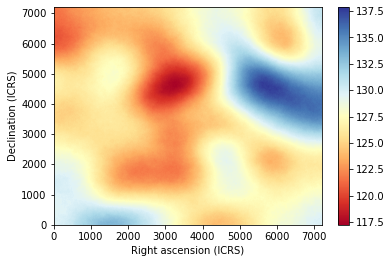

2022-08-13 15:46:56,806 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:46:56,808 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 188.32 [MHz] ...
2022-08-13 15:47:03,146 : add_ss : INFO : The small scale map is generated using alpha=0.03639961622243181, beta=0.2608151388800715.
2022-08-13 15:47:10,728 : simulate_frequency : INFO : Done simulate map at 188.32 [MHz].
2022-08-13 15:47:11,734 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-hig-188-196-FoV4/gsync_fov4_44-23_188.32.fits']


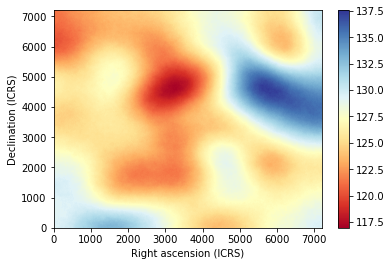

2022-08-13 15:47:17,736 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:47:17,738 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 188.48 [MHz] ...
2022-08-13 15:47:24,108 : add_ss : INFO : The small scale map is generated using alpha=0.03639961622243181, beta=0.2608151388800715.
2022-08-13 15:47:31,907 : simulate_frequency : INFO : Done simulate map at 188.48 [MHz].
2022-08-13 15:47:32,927 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-hig-188-196-FoV4/gsync_fov4_44-23_188.48.fits']


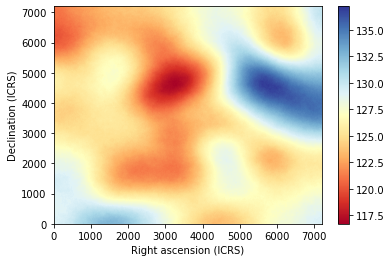

2022-08-13 15:47:38,912 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:47:38,914 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 188.64 [MHz] ...
2022-08-13 15:47:45,434 : add_ss : INFO : The small scale map is generated using alpha=0.03639961622243181, beta=0.2608151388800715.
2022-08-13 15:47:53,237 : simulate_frequency : INFO : Done simulate map at 188.64 [MHz].
2022-08-13 15:47:54,300 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-hig-188-196-FoV4/gsync_fov4_44-23_188.64.fits']


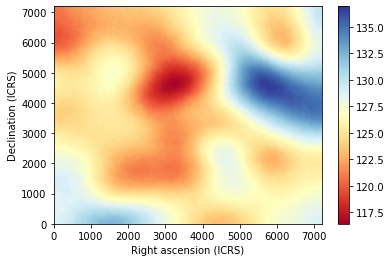

2022-08-13 15:48:00,356 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:48:00,359 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 188.80 [MHz] ...
2022-08-13 15:48:06,892 : add_ss : INFO : The small scale map is generated using alpha=0.03639961622243181, beta=0.2608151388800715.
2022-08-13 15:48:14,428 : simulate_frequency : INFO : Done simulate map at 188.80 [MHz].
2022-08-13 15:48:15,455 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-hig-188-196-FoV4/gsync_fov4_44-23_188.80.fits']


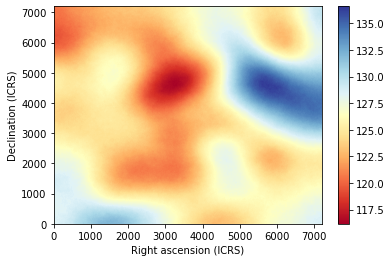

2022-08-13 15:48:21,557 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:48:21,559 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 188.96 [MHz] ...
2022-08-13 15:48:27,937 : add_ss : INFO : The small scale map is generated using alpha=0.03639961622243181, beta=0.2608151388800715.
2022-08-13 15:48:35,474 : simulate_frequency : INFO : Done simulate map at 188.96 [MHz].
2022-08-13 15:48:36,544 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-hig-188-196-FoV4/gsync_fov4_44-23_188.96.fits']


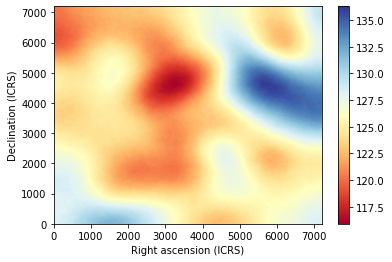

2022-08-13 15:48:42,638 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:48:42,640 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 189.12 [MHz] ...
2022-08-13 15:48:49,020 : add_ss : INFO : The small scale map is generated using alpha=0.03639961622243181, beta=0.2608151388800715.
2022-08-13 15:48:56,558 : simulate_frequency : INFO : Done simulate map at 189.12 [MHz].
2022-08-13 15:48:57,627 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-hig-188-196-FoV4/gsync_fov4_44-23_189.12.fits']


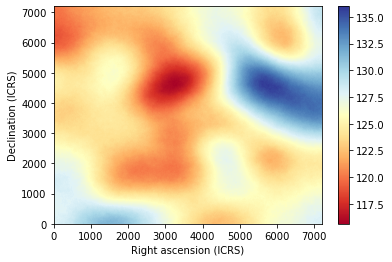

2022-08-13 15:48:59,940 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:48:59,942 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 189.28 [MHz] ...
2022-08-13 15:49:05,320 : add_ss : INFO : The small scale map is generated using alpha=0.03639961622243181, beta=0.2608151388800715.
2022-08-13 15:49:12,255 : simulate_frequency : INFO : Done simulate map at 189.28 [MHz].
2022-08-13 15:49:12,734 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-hig-188-196-FoV4/gsync_fov4_44-23_189.28.fits']


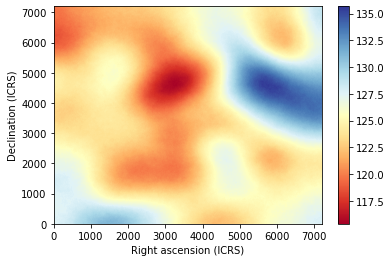

2022-08-13 15:49:17,559 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:49:17,561 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 189.44 [MHz] ...
2022-08-13 15:49:23,883 : add_ss : INFO : The small scale map is generated using alpha=0.03639961622243181, beta=0.2608151388800715.
2022-08-13 15:49:31,365 : simulate_frequency : INFO : Done simulate map at 189.44 [MHz].
2022-08-13 15:49:32,426 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-hig-188-196-FoV4/gsync_fov4_44-23_189.44.fits']


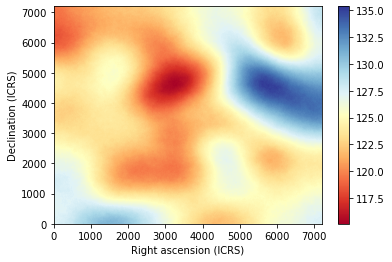

2022-08-13 15:49:38,400 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:49:38,402 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 189.60 [MHz] ...
2022-08-13 15:49:44,728 : add_ss : INFO : The small scale map is generated using alpha=0.03639961622243181, beta=0.2608151388800715.
2022-08-13 15:49:52,201 : simulate_frequency : INFO : Done simulate map at 189.60 [MHz].
2022-08-13 15:49:53,206 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-hig-188-196-FoV4/gsync_fov4_44-23_189.60.fits']


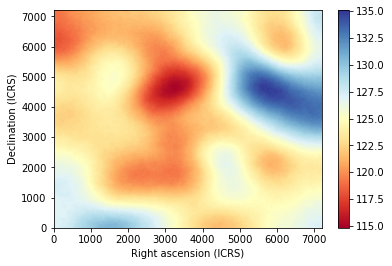

2022-08-13 15:49:59,176 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:49:59,178 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 189.76 [MHz] ...
2022-08-13 15:50:05,523 : add_ss : INFO : The small scale map is generated using alpha=0.03639961622243181, beta=0.2608151388800715.
2022-08-13 15:50:13,025 : simulate_frequency : INFO : Done simulate map at 189.76 [MHz].
2022-08-13 15:50:14,052 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-hig-188-196-FoV4/gsync_fov4_44-23_189.76.fits']


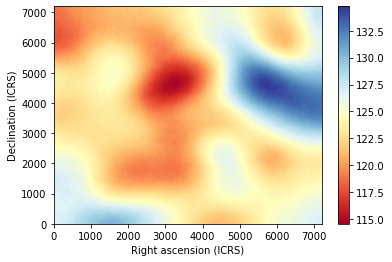

2022-08-13 15:50:20,127 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:50:20,130 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 189.92 [MHz] ...
2022-08-13 15:50:26,506 : add_ss : INFO : The small scale map is generated using alpha=0.03639961622243181, beta=0.2608151388800715.
2022-08-13 15:50:34,032 : simulate_frequency : INFO : Done simulate map at 189.92 [MHz].
2022-08-13 15:50:35,060 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-hig-188-196-FoV4/gsync_fov4_44-23_189.92.fits']


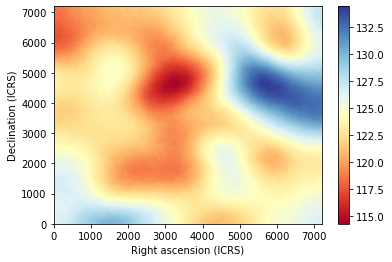

2022-08-13 15:50:41,152 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:50:41,154 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 190.08 [MHz] ...
2022-08-13 15:50:47,525 : add_ss : INFO : The small scale map is generated using alpha=0.03639961622243181, beta=0.2608151388800715.
2022-08-13 15:50:55,065 : simulate_frequency : INFO : Done simulate map at 190.08 [MHz].
2022-08-13 15:50:56,136 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-hig-188-196-FoV4/gsync_fov4_44-23_190.08.fits']


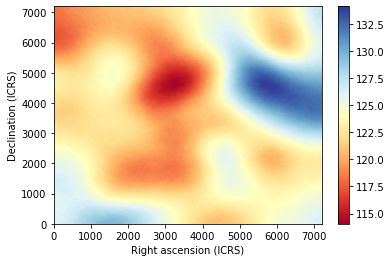

2022-08-13 15:51:02,232 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:51:02,234 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 190.24 [MHz] ...
2022-08-13 15:51:08,612 : add_ss : INFO : The small scale map is generated using alpha=0.03639961622243181, beta=0.2608151388800715.
2022-08-13 15:51:16,156 : simulate_frequency : INFO : Done simulate map at 190.24 [MHz].
2022-08-13 15:51:17,186 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-hig-188-196-FoV4/gsync_fov4_44-23_190.24.fits']


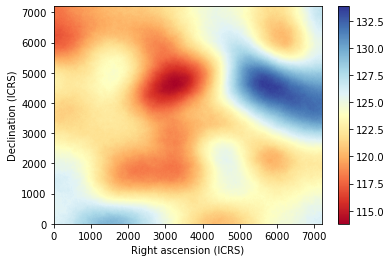

2022-08-13 15:51:23,277 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:51:23,279 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 190.40 [MHz] ...
2022-08-13 15:51:29,660 : add_ss : INFO : The small scale map is generated using alpha=0.03639961622243181, beta=0.2608151388800715.
2022-08-13 15:51:37,203 : simulate_frequency : INFO : Done simulate map at 190.40 [MHz].
2022-08-13 15:51:38,236 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-hig-188-196-FoV4/gsync_fov4_44-23_190.40.fits']


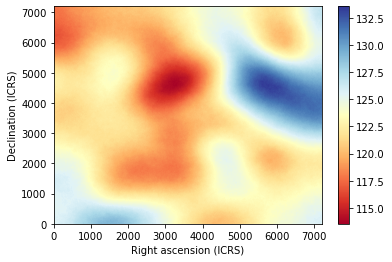

2022-08-13 15:51:44,317 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:51:44,319 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 190.56 [MHz] ...
2022-08-13 15:51:50,686 : add_ss : INFO : The small scale map is generated using alpha=0.03639961622243181, beta=0.2608151388800715.
2022-08-13 15:51:58,227 : simulate_frequency : INFO : Done simulate map at 190.56 [MHz].
2022-08-13 15:51:59,257 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-hig-188-196-FoV4/gsync_fov4_44-23_190.56.fits']


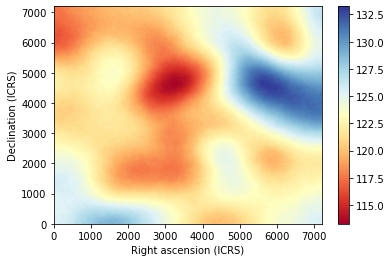

2022-08-13 15:52:05,341 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:52:05,344 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 190.72 [MHz] ...
2022-08-13 15:52:11,714 : add_ss : INFO : The small scale map is generated using alpha=0.03639961622243181, beta=0.2608151388800715.
2022-08-13 15:52:19,255 : simulate_frequency : INFO : Done simulate map at 190.72 [MHz].
2022-08-13 15:52:20,284 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-hig-188-196-FoV4/gsync_fov4_44-23_190.72.fits']


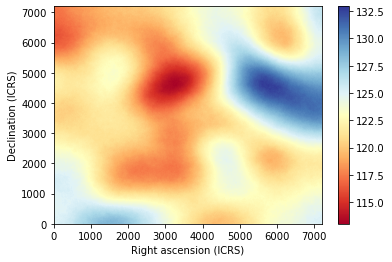

2022-08-13 15:52:26,343 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:52:26,346 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 190.88 [MHz] ...
2022-08-13 15:52:32,711 : add_ss : INFO : The small scale map is generated using alpha=0.03639961622243181, beta=0.2608151388800715.
2022-08-13 15:52:40,251 : simulate_frequency : INFO : Done simulate map at 190.88 [MHz].
2022-08-13 15:52:41,280 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-hig-188-196-FoV4/gsync_fov4_44-23_190.88.fits']


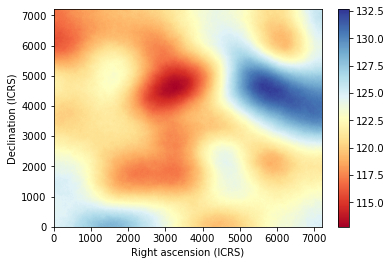

2022-08-13 15:52:43,596 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:52:43,598 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 191.04 [MHz] ...
2022-08-13 15:52:49,411 : add_ss : INFO : The small scale map is generated using alpha=0.03639961622243181, beta=0.2608151388800715.
2022-08-13 15:52:56,597 : simulate_frequency : INFO : Done simulate map at 191.04 [MHz].
2022-08-13 15:52:57,218 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-hig-188-196-FoV4/gsync_fov4_44-23_191.04.fits']


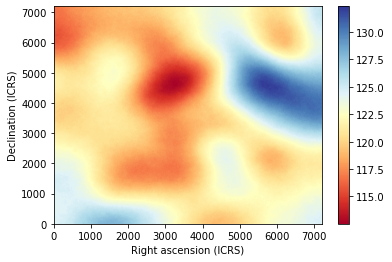

2022-08-13 15:53:02,107 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:53:02,110 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 191.20 [MHz] ...
2022-08-13 15:53:08,454 : add_ss : INFO : The small scale map is generated using alpha=0.03639961622243181, beta=0.2608151388800715.
2022-08-13 15:53:15,961 : simulate_frequency : INFO : Done simulate map at 191.20 [MHz].
2022-08-13 15:53:16,968 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-hig-188-196-FoV4/gsync_fov4_44-23_191.20.fits']


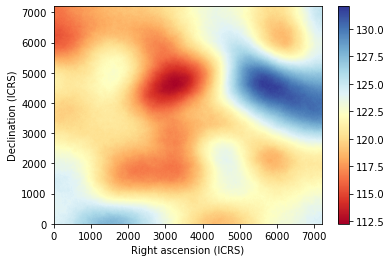

2022-08-13 15:53:23,026 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:53:23,028 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 191.36 [MHz] ...
2022-08-13 15:53:29,399 : add_ss : INFO : The small scale map is generated using alpha=0.03639961622243181, beta=0.2608151388800715.
2022-08-13 15:53:36,919 : simulate_frequency : INFO : Done simulate map at 191.36 [MHz].
2022-08-13 15:53:37,953 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-hig-188-196-FoV4/gsync_fov4_44-23_191.36.fits']


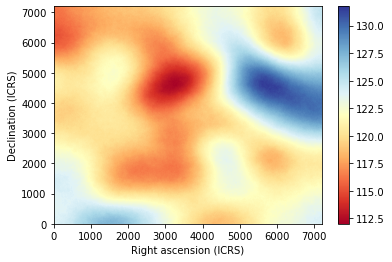

2022-08-13 15:53:44,040 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:53:44,042 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 191.52 [MHz] ...
2022-08-13 15:53:50,413 : add_ss : INFO : The small scale map is generated using alpha=0.03639961622243181, beta=0.2608151388800715.
2022-08-13 15:53:57,939 : simulate_frequency : INFO : Done simulate map at 191.52 [MHz].
2022-08-13 15:53:58,966 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-hig-188-196-FoV4/gsync_fov4_44-23_191.52.fits']


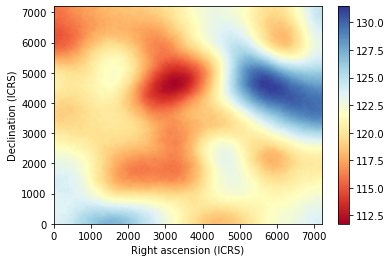

2022-08-13 15:54:05,057 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:54:05,060 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 191.68 [MHz] ...
2022-08-13 15:54:11,429 : add_ss : INFO : The small scale map is generated using alpha=0.03639961622243181, beta=0.2608151388800715.
2022-08-13 15:54:18,962 : simulate_frequency : INFO : Done simulate map at 191.68 [MHz].
2022-08-13 15:54:19,991 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-hig-188-196-FoV4/gsync_fov4_44-23_191.68.fits']


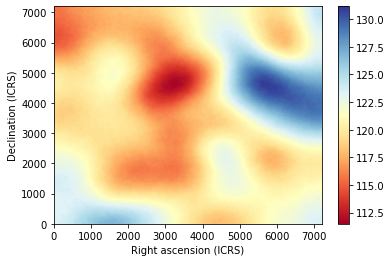

2022-08-13 15:54:26,061 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:54:26,064 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 191.84 [MHz] ...
2022-08-13 15:54:32,431 : add_ss : INFO : The small scale map is generated using alpha=0.03639961622243181, beta=0.2608151388800715.
2022-08-13 15:54:39,972 : simulate_frequency : INFO : Done simulate map at 191.84 [MHz].
2022-08-13 15:54:41,001 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-hig-188-196-FoV4/gsync_fov4_44-23_191.84.fits']


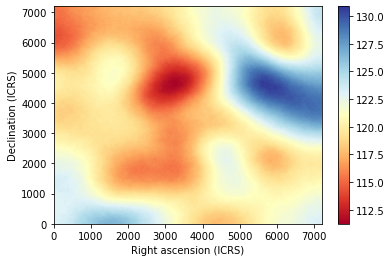

2022-08-13 15:54:47,060 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:54:47,062 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 192.00 [MHz] ...
2022-08-13 15:54:53,430 : add_ss : INFO : The small scale map is generated using alpha=0.03639961622243181, beta=0.2608151388800715.
2022-08-13 15:55:00,983 : simulate_frequency : INFO : Done simulate map at 192.00 [MHz].
2022-08-13 15:55:02,029 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-hig-188-196-FoV4/gsync_fov4_44-23_192.00.fits']


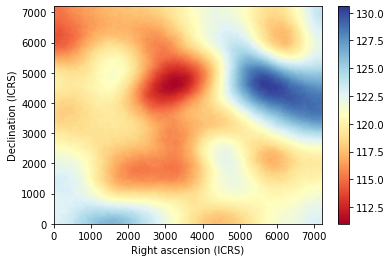

2022-08-13 15:55:08,109 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:55:08,111 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 192.16 [MHz] ...
2022-08-13 15:55:14,491 : add_ss : INFO : The small scale map is generated using alpha=0.03639961622243181, beta=0.2608151388800715.
2022-08-13 15:55:22,049 : simulate_frequency : INFO : Done simulate map at 192.16 [MHz].
2022-08-13 15:55:23,080 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-hig-188-196-FoV4/gsync_fov4_44-23_192.16.fits']


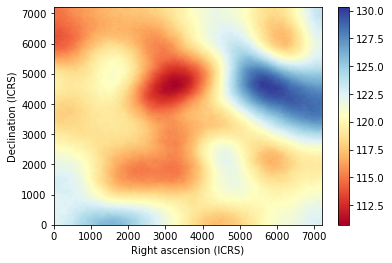

2022-08-13 15:55:29,151 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:55:29,153 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 192.32 [MHz] ...
2022-08-13 15:55:35,526 : add_ss : INFO : The small scale map is generated using alpha=0.03639961622243181, beta=0.2608151388800715.
2022-08-13 15:55:43,063 : simulate_frequency : INFO : Done simulate map at 192.32 [MHz].
2022-08-13 15:55:44,091 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-hig-188-196-FoV4/gsync_fov4_44-23_192.32.fits']


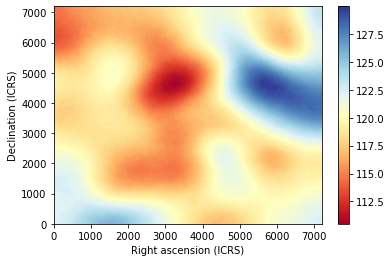

2022-08-13 15:55:50,149 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:55:50,152 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 192.48 [MHz] ...
2022-08-13 15:55:56,519 : add_ss : INFO : The small scale map is generated using alpha=0.03639961622243181, beta=0.2608151388800715.
2022-08-13 15:56:04,050 : simulate_frequency : INFO : Done simulate map at 192.48 [MHz].
2022-08-13 15:56:05,078 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-hig-188-196-FoV4/gsync_fov4_44-23_192.48.fits']


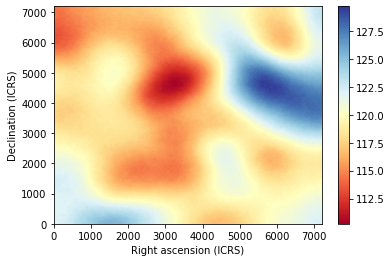

2022-08-13 15:56:11,135 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:56:11,137 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 192.64 [MHz] ...
2022-08-13 15:56:17,507 : add_ss : INFO : The small scale map is generated using alpha=0.03639961622243181, beta=0.2608151388800715.
2022-08-13 15:56:25,048 : simulate_frequency : INFO : Done simulate map at 192.64 [MHz].
2022-08-13 15:56:26,076 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-hig-188-196-FoV4/gsync_fov4_44-23_192.64.fits']


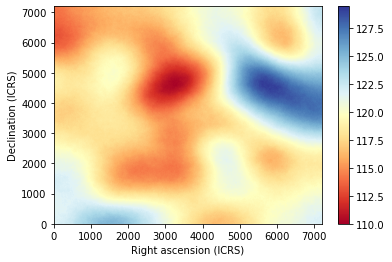

2022-08-13 15:56:28,396 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:56:28,398 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 192.80 [MHz] ...
2022-08-13 15:56:34,224 : add_ss : INFO : The small scale map is generated using alpha=0.03639961622243181, beta=0.2608151388800715.
2022-08-13 15:56:41,444 : simulate_frequency : INFO : Done simulate map at 192.80 [MHz].
2022-08-13 15:56:42,070 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-hig-188-196-FoV4/gsync_fov4_44-23_192.80.fits']


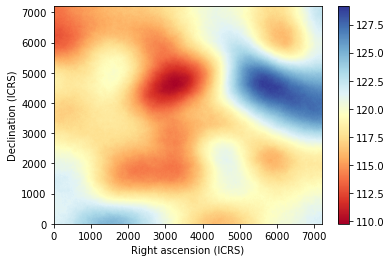

2022-08-13 15:56:47,043 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:56:47,045 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 192.96 [MHz] ...
2022-08-13 15:56:53,413 : add_ss : INFO : The small scale map is generated using alpha=0.03639961622243181, beta=0.2608151388800715.
2022-08-13 15:57:00,938 : simulate_frequency : INFO : Done simulate map at 192.96 [MHz].
2022-08-13 15:57:01,969 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-hig-188-196-FoV4/gsync_fov4_44-23_192.96.fits']


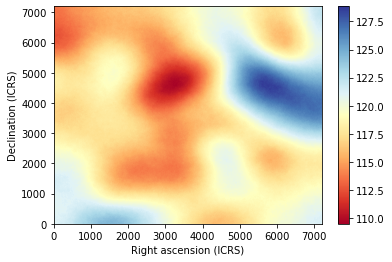

2022-08-13 15:57:08,054 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:57:08,056 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 193.12 [MHz] ...
2022-08-13 15:57:14,421 : add_ss : INFO : The small scale map is generated using alpha=0.03639961622243181, beta=0.2608151388800715.
2022-08-13 15:57:21,943 : simulate_frequency : INFO : Done simulate map at 193.12 [MHz].
2022-08-13 15:57:22,975 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-hig-188-196-FoV4/gsync_fov4_44-23_193.12.fits']


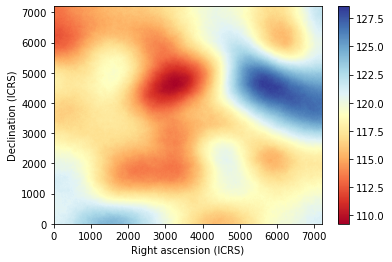

2022-08-13 15:57:29,052 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:57:29,054 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 193.28 [MHz] ...
2022-08-13 15:57:35,426 : add_ss : INFO : The small scale map is generated using alpha=0.03639961622243181, beta=0.2608151388800715.
2022-08-13 15:57:42,949 : simulate_frequency : INFO : Done simulate map at 193.28 [MHz].
2022-08-13 15:57:43,976 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-hig-188-196-FoV4/gsync_fov4_44-23_193.28.fits']


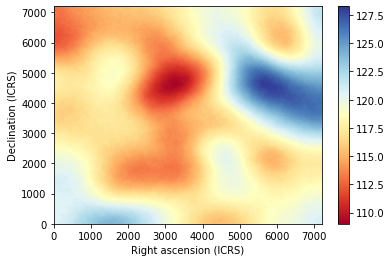

2022-08-13 15:57:50,041 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:57:50,043 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 193.44 [MHz] ...
2022-08-13 15:57:56,411 : add_ss : INFO : The small scale map is generated using alpha=0.03639961622243181, beta=0.2608151388800715.
2022-08-13 15:58:03,925 : simulate_frequency : INFO : Done simulate map at 193.44 [MHz].
2022-08-13 15:58:04,953 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-hig-188-196-FoV4/gsync_fov4_44-23_193.44.fits']


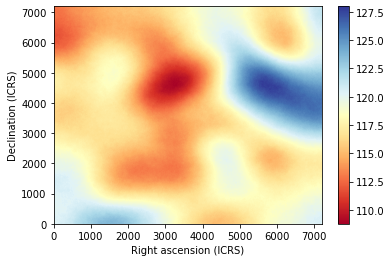

2022-08-13 15:58:11,016 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:58:11,019 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 193.60 [MHz] ...
2022-08-13 15:58:17,386 : add_ss : INFO : The small scale map is generated using alpha=0.03639961622243181, beta=0.2608151388800715.
2022-08-13 15:58:24,912 : simulate_frequency : INFO : Done simulate map at 193.60 [MHz].
2022-08-13 15:58:25,976 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-hig-188-196-FoV4/gsync_fov4_44-23_193.60.fits']


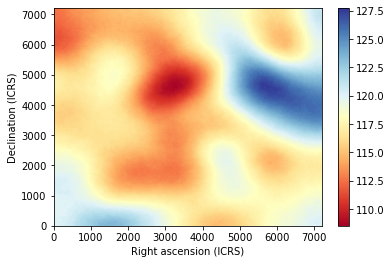

2022-08-13 15:58:32,026 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:58:32,028 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 193.76 [MHz] ...
2022-08-13 15:58:38,399 : add_ss : INFO : The small scale map is generated using alpha=0.03639961622243181, beta=0.2608151388800715.
2022-08-13 15:58:45,941 : simulate_frequency : INFO : Done simulate map at 193.76 [MHz].
2022-08-13 15:58:47,009 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-hig-188-196-FoV4/gsync_fov4_44-23_193.76.fits']


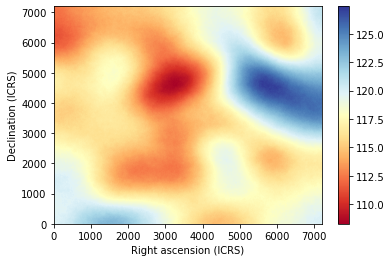

2022-08-13 15:58:53,078 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:58:53,080 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 193.92 [MHz] ...
2022-08-13 15:58:59,455 : add_ss : INFO : The small scale map is generated using alpha=0.03639961622243181, beta=0.2608151388800715.
2022-08-13 15:59:06,988 : simulate_frequency : INFO : Done simulate map at 193.92 [MHz].
2022-08-13 15:59:08,015 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-hig-188-196-FoV4/gsync_fov4_44-23_193.92.fits']


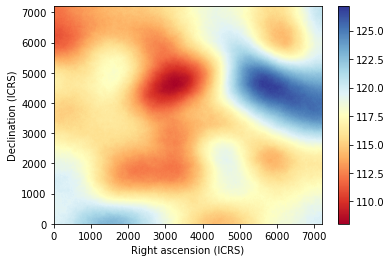

2022-08-13 15:59:14,071 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:59:14,074 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 194.08 [MHz] ...
2022-08-13 15:59:20,438 : add_ss : INFO : The small scale map is generated using alpha=0.03639961622243181, beta=0.2608151388800715.
2022-08-13 15:59:27,979 : simulate_frequency : INFO : Done simulate map at 194.08 [MHz].
2022-08-13 15:59:29,043 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-hig-188-196-FoV4/gsync_fov4_44-23_194.08.fits']


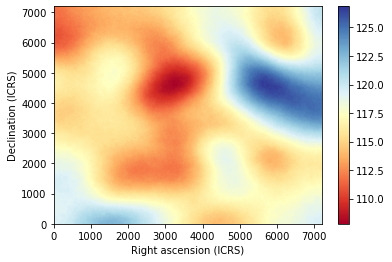

2022-08-13 15:59:35,096 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:59:35,098 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 194.24 [MHz] ...
2022-08-13 15:59:41,468 : add_ss : INFO : The small scale map is generated using alpha=0.03639961622243181, beta=0.2608151388800715.
2022-08-13 15:59:48,996 : simulate_frequency : INFO : Done simulate map at 194.24 [MHz].
2022-08-13 15:59:50,020 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-hig-188-196-FoV4/gsync_fov4_44-23_194.24.fits']


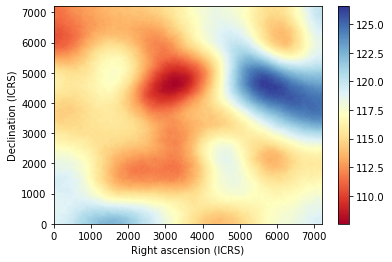

2022-08-13 15:59:56,068 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 15:59:56,070 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 194.40 [MHz] ...
2022-08-13 16:00:02,435 : add_ss : INFO : The small scale map is generated using alpha=0.03639961622243181, beta=0.2608151388800715.
2022-08-13 16:00:09,978 : simulate_frequency : INFO : Done simulate map at 194.40 [MHz].
2022-08-13 16:00:11,040 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-hig-188-196-FoV4/gsync_fov4_44-23_194.40.fits']


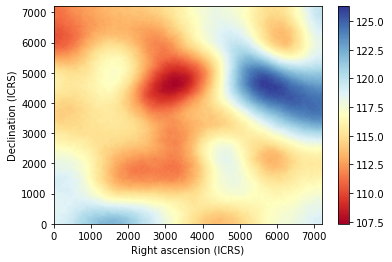

2022-08-13 16:00:13,355 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 16:00:13,357 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 194.56 [MHz] ...
2022-08-13 16:00:19,194 : add_ss : INFO : The small scale map is generated using alpha=0.03639961622243181, beta=0.2608151388800715.
2022-08-13 16:00:26,417 : simulate_frequency : INFO : Done simulate map at 194.56 [MHz].
2022-08-13 16:00:27,053 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-hig-188-196-FoV4/gsync_fov4_44-23_194.56.fits']


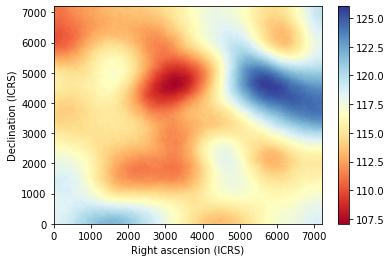

2022-08-13 16:00:32,036 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 16:00:32,038 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 194.72 [MHz] ...
2022-08-13 16:00:38,403 : add_ss : INFO : The small scale map is generated using alpha=0.03639961622243181, beta=0.2608151388800715.
2022-08-13 16:00:45,924 : simulate_frequency : INFO : Done simulate map at 194.72 [MHz].
2022-08-13 16:00:46,967 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-hig-188-196-FoV4/gsync_fov4_44-23_194.72.fits']


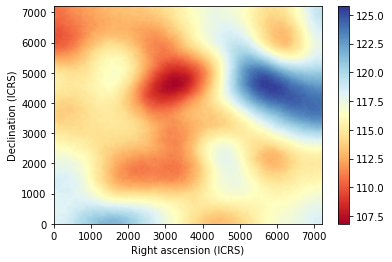

2022-08-13 16:00:53,031 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 16:00:53,034 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 194.88 [MHz] ...
2022-08-13 16:00:59,395 : add_ss : INFO : The small scale map is generated using alpha=0.03639961622243181, beta=0.2608151388800715.
2022-08-13 16:01:06,908 : simulate_frequency : INFO : Done simulate map at 194.88 [MHz].
2022-08-13 16:01:07,934 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-hig-188-196-FoV4/gsync_fov4_44-23_194.88.fits']


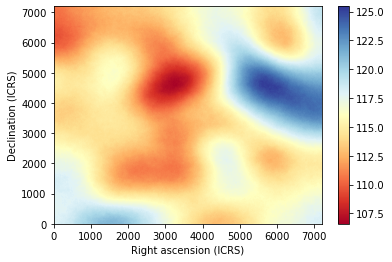

2022-08-13 16:01:13,986 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 16:01:13,988 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 195.04 [MHz] ...
2022-08-13 16:01:20,353 : add_ss : INFO : The small scale map is generated using alpha=0.03639961622243181, beta=0.2608151388800715.
2022-08-13 16:01:27,875 : simulate_frequency : INFO : Done simulate map at 195.04 [MHz].
2022-08-13 16:01:28,919 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-hig-188-196-FoV4/gsync_fov4_44-23_195.04.fits']


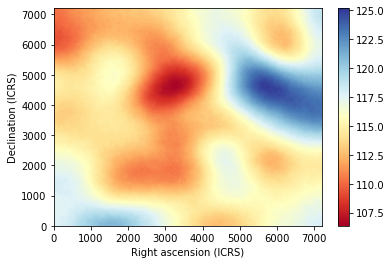

2022-08-13 16:01:34,985 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 16:01:34,987 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 195.20 [MHz] ...
2022-08-13 16:01:41,359 : add_ss : INFO : The small scale map is generated using alpha=0.03639961622243181, beta=0.2608151388800715.
2022-08-13 16:01:48,867 : simulate_frequency : INFO : Done simulate map at 195.20 [MHz].
2022-08-13 16:01:49,898 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-hig-188-196-FoV4/gsync_fov4_44-23_195.20.fits']


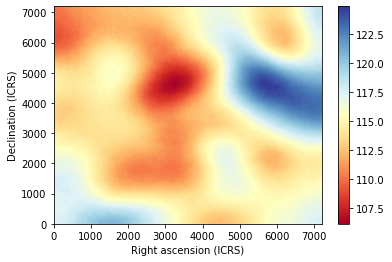

2022-08-13 16:01:55,953 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 16:01:55,956 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 195.36 [MHz] ...
2022-08-13 16:02:02,325 : add_ss : INFO : The small scale map is generated using alpha=0.03639961622243181, beta=0.2608151388800715.
2022-08-13 16:02:09,856 : simulate_frequency : INFO : Done simulate map at 195.36 [MHz].
2022-08-13 16:02:10,922 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-hig-188-196-FoV4/gsync_fov4_44-23_195.36.fits']


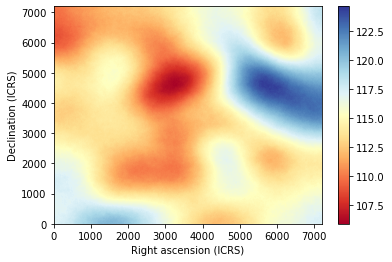

2022-08-13 16:02:16,974 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 16:02:16,976 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 195.52 [MHz] ...
2022-08-13 16:02:23,349 : add_ss : INFO : The small scale map is generated using alpha=0.03639961622243181, beta=0.2608151388800715.
2022-08-13 16:02:30,879 : simulate_frequency : INFO : Done simulate map at 195.52 [MHz].
2022-08-13 16:02:31,944 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-hig-188-196-FoV4/gsync_fov4_44-23_195.52.fits']


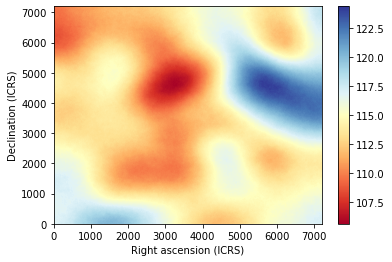

2022-08-13 16:02:37,992 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 16:02:37,994 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 195.68 [MHz] ...
2022-08-13 16:02:44,362 : add_ss : INFO : The small scale map is generated using alpha=0.03639961622243181, beta=0.2608151388800715.
2022-08-13 16:02:51,900 : simulate_frequency : INFO : Done simulate map at 195.68 [MHz].
2022-08-13 16:02:52,966 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-hig-188-196-FoV4/gsync_fov4_44-23_195.68.fits']


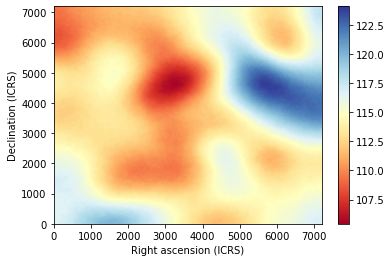

2022-08-13 16:02:59,024 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 16:02:59,026 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 195.84 [MHz] ...
2022-08-13 16:03:05,396 : add_ss : INFO : The small scale map is generated using alpha=0.03639961622243181, beta=0.2608151388800715.
2022-08-13 16:03:12,935 : simulate_frequency : INFO : Done simulate map at 195.84 [MHz].
2022-08-13 16:03:13,961 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-hig-188-196-FoV4/gsync_fov4_44-23_195.84.fits']


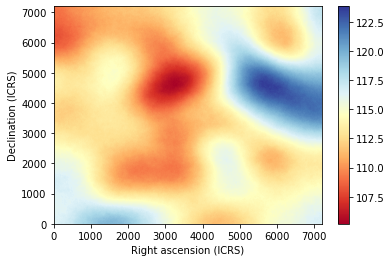

2022-08-13 16:03:20,019 : simulate : INFO : Simulating Galactic synchrotron (unpolarized) ...
2022-08-13 16:03:20,022 : simulate_frequency : INFO : Simulating Galactic synchrotron (unpolarized) map at 196.00 [MHz] ...
2022-08-13 16:03:26,395 : add_ss : INFO : The small scale map is generated using alpha=0.03639961622243181, beta=0.2608151388800715.
2022-08-13 16:03:33,957 : simulate_frequency : INFO : Done simulate map at 196.00 [MHz].
2022-08-13 16:03:34,989 : simulate : INFO : Done simulate Galactic synchrotron (unpolarized)!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gsync-band-hig-188-196-FoV4/gsync_fov4_44-23_196.00.fits']


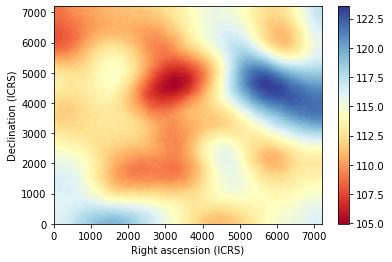

In [29]:
do_simulation(S.freqs['hig']['f'], S, s_outhig)